In [ ]:
import os
import json
import shutil
import cv2
import numpy as np
from glob import glob
from sklearn.model_selection import train_test_split
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torch.nn as nn
import torch.optim as optim
from torch.cuda import amp
import matplotlib.pyplot as plt
from torchvision import transforms as T
import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.cluster import DBSCAN
from PIL import Image, ImageDraw
from tqdm import tqdm
import warnings
from pathlib import Path
from collections import defaultdict
import random
import time
import gc
from sklearn.metrics import accuracy_score
from torch.nn import functional as F
import uuid
warnings.filterwarnings('ignore')
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"
os.environ['CUDA_LAUNCH_BLOCKING'] = '1'

In [ ]:
%matplotlib inline

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
clip_directories = {
"Clip1": { "image": "/content/drive/MyDrive/Annotated_Files/Clip1/images",
	         "json": "/content/drive/MyDrive/Annotated_Files/Clip1/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip1/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip1/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip1/visualizations"},


"Clip2": { "image": "/content/drive/MyDrive/Annotated_Files/Clip2/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip2/jsons",
           "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip2/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip2/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip2/visualizations"},

"Clip3": { "image": "/content/drive/MyDrive/Annotated_Files/Clip3/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip3/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip3/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip3/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip3/visualizations"},

"Clip4": { "image": "/content/drive/MyDrive/Annotated_Files/Clip4/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip4/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip4/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip4/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip4/visualizations"},

"Clip5": { "image": "/content/drive/MyDrive/Annotated_Files/Clip5/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip5/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip5/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip5/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip5/visualizations"},

"Clip6": { "image": "/content/drive/MyDrive/Annotated_Files/Clip6/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip6/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip6/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip6/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip6/visualizations"},

"Clip7": { "image": "/content/drive/MyDrive/Annotated_Files/Clip7/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip7/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip7/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip7/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip7/visualizations"},

"Clip8": { "image": "/content/drive/MyDrive/Annotated_Files/Clip8/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip8/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip8/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip8/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip8/visualizations"},

"Clip9": { "image": "/content/drive/MyDrive/Annotated_Files/Clip9/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip9/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip9/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip9/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip9/visualizations"},

"Clip10": { "image": "/content/drive/MyDrive/Annotated_Files/Clip10/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip10/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip10/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip10/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip10/visualizations"},

"Clip11": { "image": "/content/drive/MyDrive/Annotated_Files/Clip11/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip11/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip11/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip11/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip11/visualizations"},

"Clip12": { "image": "/content/drive/MyDrive/Annotated_Files/Clip12/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip12/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip12/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip12/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip12/visualizations"},

"Clip13": { "image": "/content/drive/MyDrive/Annotated_Files/Clip13/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip13/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip13/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip13/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip13/visualizations"},

"Clip14": { "image": "/content/drive/MyDrive/Annotated_Files/Clip14/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip14/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip14/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip14/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip14/visualizations"},

"Clip15": { "image": "/content/drive/MyDrive/Annotated_Files/Clip15/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip15/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip15/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip15/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip15/visualizations"},

"Clip16": { "image": "/content/drive/MyDrive/Annotated_Files/Clip16/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip16/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip16/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip16/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip16/visualizations"},


"Clip17": { "image": "/content/drive/MyDrive/Annotated_Files/Clip17/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip17/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip17/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip17/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip17/visualizations"},

"Clip18": { "image": "/content/drive/MyDrive/Annotated_Files/Clip18/images",
           "json": "/content/drive/MyDrive/Annotated_Files/Clip18/jsons",
	         "binary_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip18/masks/binary",
	         "instance_mask": "/content/drive/MyDrive/Annotated_Files/Output/Clip18/masks/instance",
	         "visualization": "/content/drive/MyDrive/Annotated_Files/Output/Clip18/visualizations"},

                      }


# Set output directory
output_folder = "/content/drive/MyDrive/Annotated_Files/Output"
video_path = "/content/drive/MyDrive/Annotated_Files/VideoTest.mp4"

In [ ]:
# Configuration - Much lighter settings
class Config:
    def __init__(self):
        self.img_height = 128
        self.img_width = 256
        self.batch_size = 1
        self.learning_rate = 5e-4
        self.epochs = 50
        self.embedding_dim = 4
        self.sequence_length = 5
        self.num_classes = 2
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        print(f"Using device: {self.device}")
        self.save_dir = './checkpoints'
        self.patience = 10

config = Config()

Using device: cpu


In [ ]:
def split_dataset(clip_directories, test_size=0.05, val_size=0.2, min_files=10):
    """Split dataset by clip folders into train (75%), validation (20%), and test (5%) sets"""
    all_files = []
    clip_to_files = defaultdict(list)

    # Collect files and group by clip
    for clip_name, paths in clip_directories.items():
        if clip_name == "Clipn":  # Skip template
            continue

        image_dir = paths["image"]
        json_dir = paths["json"]
        binary_mask_dir = paths["binary_mask"]
        instance_mask_dir = paths["instance_mask"]
        visualization_dir = paths["visualization"]

        print(f"Checking {clip_name}...")
        print(f"  Image dir exists: {os.path.exists(image_dir)}")
        print(f"  JSON dir exists: {os.path.exists(json_dir)}")
        print(f"  Binary mask dir exists: {os.path.exists(binary_mask_dir)}")
        print(f"  Instance mask dir exists: {os.path.exists(instance_mask_dir)}")
        print(f"  Visualization dir exists: {os.path.exists(visualization_dir)}")

        if os.path.exists(image_dir) and os.path.exists(json_dir) and os.path.exists(binary_mask_dir):
            # Get all image files
            image_files = glob(os.path.join(image_dir, "*.jpg")) + glob(os.path.join(image_dir, "*.png"))
            print(f"  Found {len(image_files)} image files")

            for img_path in image_files:
                base_name = os.path.splitext(os.path.basename(img_path))[0]
                json_path = os.path.join(json_dir, base_name + ".json")
                binary_mask_path = os.path.join(binary_mask_dir, base_name + "_binary.png")
                instance_mask_path = os.path.join(instance_mask_dir, base_name + "_instance.png")
                visualization_path = os.path.join(visualization_dir, base_name + "_visualization.png")

                if os.path.exists(json_path) and os.path.exists(binary_mask_path):
                    file_entry = {
                        'image': img_path,
                        'json': json_path,
                        'binary_mask': binary_mask_path,
                        'instance_mask': instance_mask_path,
                        'visualization': visualization_path,
                        'clip': clip_name
                    }
                    all_files.append(file_entry)
                    clip_to_files[clip_name].append(file_entry)

    print(f"Total files found: {len(all_files)}")
    print(f"Total clips found: {len(clip_to_files)}")

    # Handle small datasets based on total files
    if len(all_files) < min_files:
        print(f"Warning: Only {len(all_files)} files found. Using simple split.")
        if len(all_files) < 3:
            return all_files, [], []  # All train, no val/test
        elif len(all_files) < 5:
            train_files = all_files[:-1]  # Reserve one file for test
            val_files = []                # No validation
            test_files = [all_files[-1]]  # One for test
        else:
            train_size = max(1, int(len(all_files) * 0.75))
            val_size = max(1, int(len(all_files) * 0.2))
            train_files = all_files[:train_size]
            val_files = all_files[train_size:train_size+val_size]
            test_files = all_files[train_size+val_size:]
    else:
        # Split by clips with 75% train, 20% val, 5% test
        clip_names = list(clip_to_files.keys())
        total_clips = len(clip_names)

        if total_clips < 3:
            print(f"Warning: Only {total_clips} clips found. Using all for training.")
            return all_files, [], []

        # Calculate clip counts for each split
        train_clip_count = max(1, int(total_clips * 0.75))  # 75% for train
        val_clip_count = max(1, int(total_clips * 0.2))     # 20% for validation
        test_clip_count = total_clips - train_clip_count - val_clip_count  # 5% for test (remaining)

        # Adjust counts to ensure exact proportions if possible
        if train_clip_count + val_clip_count + test_clip_count != total_clips:
            test_clip_count = total_clips - train_clip_count - val_clip_count

        print(f"Target split - Train clips: {train_clip_count}, Val clips: {val_clip_count}, Test clips: {test_clip_count}")

        # Randomize clips
        random.seed(42)  # For reproducibility
        random.shuffle(clip_names)

        # Assign clips to splits
        train_clips = clip_names[:train_clip_count]
        val_clips = clip_names[train_clip_count:train_clip_count + val_clip_count]
        test_clips = clip_names[train_clip_count + val_clip_count:]

        # Collect files for each split
        train_files = [file for clip in train_clips for file in clip_to_files[clip]]
        val_files = [file for clip in val_clips for file in clip_to_files[clip]]
        test_files = [file for clip in test_clips for file in clip_to_files[clip]]

    print(f"Split - Train clips: {len(train_clips if len(all_files) >= min_files else 0)}, "
          f"Val clips: {len(val_clips if len(all_files) >= min_files else 0)}, "
          f"Test clips: {len(test_clips if len(all_files) >= min_files else 0)}")
    print(f"Split - Train files: {len(train_files)}, Val files: {len(val_files)}, Test files: {len(test_files)}")

    return train_files, val_files, test_files

In [ ]:
# 1. Split dataset
print("Splitting dataset...")
train_files, val_files, test_files = split_dataset(clip_directories)

Splitting dataset...
Checking Clip1...
  Image dir exists: True
  JSON dir exists: True
  Binary mask dir exists: True
  Instance mask dir exists: True
  Visualization dir exists: True
  Found 26 image files
Checking Clip2...
  Image dir exists: True
  JSON dir exists: True
  Binary mask dir exists: True
  Instance mask dir exists: True
  Visualization dir exists: True
  Found 39 image files
Checking Clip3...
  Image dir exists: True
  JSON dir exists: True
  Binary mask dir exists: True
  Instance mask dir exists: True
  Visualization dir exists: True
  Found 12 image files
Checking Clip4...
  Image dir exists: True
  JSON dir exists: True
  Binary mask dir exists: True
  Instance mask dir exists: True
  Visualization dir exists: True
  Found 11 image files
Checking Clip5...
  Image dir exists: True
  JSON dir exists: True
  Binary mask dir exists: True
  Instance mask dir exists: True
  Visualization dir exists: True
  Found 42 image files
Checking Clip6...
  Image dir exists: True
 

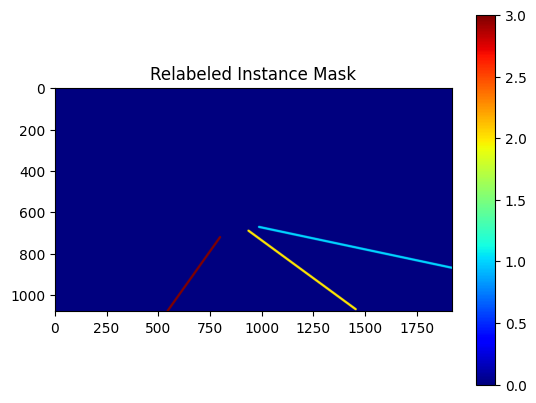

Relabeled unique values: [0, 1, 2, 3]
Number of objects: 3


In [ ]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt

def relabel_instance_mask(instance_mask, max_lanes=5):
    # Convert to numpy if tensor
    instance_mask = instance_mask.numpy() if isinstance(instance_mask, torch.Tensor) else instance_mask

    # Get unique non-zero labels
    unique_labels = np.unique(instance_mask)[1:]  # Exclude background (0)

    # Initialize new mask
    new_mask = np.zeros_like(instance_mask, dtype=np.uint8)

    # Map existing labels to consecutive integers (1 to min(len(unique_labels), max_lanes))
    if len(unique_labels) > 0:
        for new_id, old_id in enumerate(unique_labels[:max_lanes], 1):
            new_mask[instance_mask == old_id] = new_id

    n_objects = min(len(unique_labels), max_lanes)
    return torch.tensor(new_mask, dtype=torch.long), n_objects

# Load and relabel the mask
img_path = "/content/drive/MyDrive/Annotated_Files/Output/Clip18/masks/instance/00000000_instance.png"  # Adjust this path
instance_mask = np.array(Image.open(img_path))
relabeled_mask, n_objects = relabel_instance_mask(instance_mask)

# Visualize
plt.imshow(relabeled_mask.numpy(), cmap='jet')
plt.colorbar()
plt.title("Relabeled Instance Mask")
plt.show()

print("Relabeled unique values:", torch.unique(relabeled_mask).tolist())
print("Number of objects:", n_objects)

In [ ]:
# Enhanced Dataset Class for LaneNet
class LaneNetDataset(Dataset):
    def __init__(self, file_list, sequence_length=5, transform=None, is_sequence=False, load_instance=True):
        self.file_list = file_list
        self.sequence_length = sequence_length
        self.transform = transform
        self.is_sequence = is_sequence
        self.load_instance = load_instance

        if is_sequence and len(file_list) > sequence_length:
            self.sequences = self._create_sequences()
        else:
            self.sequences = file_list
            self.is_sequence = False

    def _create_sequences(self):
        """Create sequences grouped by clip for LSTM"""
        clip_files = defaultdict(list)

        for file_info in self.file_list:
            clip_files[file_info['clip']].append(file_info)

        # Sort files within each clip by filename
        for clip in clip_files:
            clip_files[clip].sort(key=lambda x: os.path.basename(x['image']))

        sequences = []
        for clip, files in clip_files.items():
            if len(files) >= self.sequence_length:
                # Create overlapping sequences with stride of 1
                for i in range(0, len(files) - self.sequence_length + 1, 2):  # stride=2 to reduce overlap
                    sequences.append(files[i:i + self.sequence_length])

        return sequences

    def _process_instance_mask(self, instance_mask):
        """Process instance mask to get number of lane instances with connected components"""
        # Convert to binary mask (assuming non-zero values are lanes)
        binary_mask = (instance_mask > 0).astype(np.uint8)

        # Find connected components
        num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary_mask, connectivity=8)

        # Initialize new mask
        new_mask = np.zeros_like(instance_mask, dtype=np.uint8)
        max_lanes = 5  # Maximum number of lanes as per your requirement

        if num_labels > 1:  # Exclude background (label 0)
            # Sort by area to keep the largest components
            component_areas = stats[1:, 4]  # Exclude background
            if len(component_areas) > max_lanes:
                top_indices = np.argsort(component_areas)[-max_lanes:][::-1]
            else:
                top_indices = range(len(component_areas))

            for idx, comp_idx in enumerate(top_indices, 1):
                new_mask[labels == comp_idx + 1] = idx

        n_objects = min(len(top_indices), max_lanes)
        return new_mask, n_objects

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        try:
            if self.is_sequence:
                sequence_files = self.sequences[idx]
                images = []
                binary_masks = []
                instance_masks = []
                n_objects_list = []

                for file_info in sequence_files:
                    # Load and process image
                    image = cv2.imread(file_info['image'])
                    if image is None:
                        continue
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    image = cv2.resize(image, (config.img_width, config.img_height))

                    # Load binary mask
                    binary_mask = cv2.imread(file_info['binary_mask'], cv2.IMREAD_GRAYSCALE)
                    if binary_mask is None:
                        continue
                    binary_mask = cv2.resize(binary_mask, (config.img_width, config.img_height))
                    binary_mask = (binary_mask > 127).astype(np.float32)

                    # Load instance mask if available
                    if self.load_instance and 'instance_mask' in file_info:
                        instance_mask = cv2.imread(file_info['instance_mask'], cv2.IMREAD_GRAYSCALE)
                        if instance_mask is not None:
                            instance_mask = cv2.resize(instance_mask, (config.img_width, config.img_height))
                            instance_mask, n_objects = self._process_instance_mask(instance_mask)
                        else:
                            instance_mask = np.zeros((config.img_height, config.img_width), dtype=np.uint8)
                            n_objects = 0
                    else:
                        instance_mask = np.zeros((config.img_height, config.img_width), dtype=np.uint8)
                        n_objects = 0

                    # Convert to tensors
                    image = torch.from_numpy(image.transpose(2, 0, 1)).float() / 255.0
                    binary_mask = torch.from_numpy(binary_mask).float()
                    instance_mask = torch.from_numpy(instance_mask).long()

                    images.append(image)
                    binary_masks.append(binary_mask)
                    instance_masks.append(instance_mask)
                    n_objects_list.append(n_objects)

                if len(images) == 0:
                    # Fallback to zeros if no valid images
                    images = [torch.zeros(3, config.img_height, config.img_width)]
                    binary_masks = [torch.zeros(config.img_height, config.img_width)]
                    instance_masks = [torch.zeros(config.img_height, config.img_width, dtype=torch.long)]
                    n_objects_list = [0]

                return {
                    'images': torch.stack(images),
                    'binary_masks': torch.stack(binary_masks),
                    'instance_masks': torch.stack(instance_masks),
                    'n_objects': torch.tensor(n_objects_list)
                }
            else:
                # Single frame
                file_info = self.sequences[idx]

                # Load image
                image = cv2.imread(file_info['image'])
                if image is None:
                    image = np.zeros((config.img_height, config.img_width, 3), dtype=np.uint8)
                else:
                    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                    image = cv2.resize(image, (config.img_width, config.img_height))

                # Load binary mask
                binary_mask = cv2.imread(file_info['binary_mask'], cv2.IMREAD_GRAYSCALE)
                if binary_mask is None:
                    binary_mask = np.zeros((config.img_height, config.img_width), dtype=np.uint8)
                else:
                    binary_mask = cv2.resize(binary_mask, (config.img_width, config.img_height))
                    binary_mask = (binary_mask > 127).astype(np.float32)

                # Load instance mask
                if self.load_instance and 'instance_mask' in file_info:
                    instance_mask = cv2.imread(file_info['instance_mask'], cv2.IMREAD_GRAYSCALE)
                    if instance_mask is not None:
                        instance_mask = cv2.resize(instance_mask, (config.img_width, config.img_height))
                        instance_mask, n_objects = self._process_instance_mask(instance_mask)
                    else:
                        instance_mask = np.zeros((config.img_height, config.img_width), dtype=np.uint8)
                        n_objects = 0
                else:
                    instance_mask = np.zeros((config.img_height, config.img_width), dtype=np.uint8)
                    n_objects = 0

                # Convert to tensors
                image = torch.from_numpy(image.transpose(2, 0, 1)).float() / 255.0
                binary_mask = torch.from_numpy(binary_mask).float()
                instance_mask = torch.from_numpy(instance_mask).long()

                return {
                    'image': image,
                    'binary_mask': binary_mask,
                    'instance_mask': instance_mask,
                    'n_objects': n_objects
                }
        except Exception as e:
            print(f"Error loading data at index {idx}: {e}")
            # Return dummy data
            if self.is_sequence:
                return {
                    'images': torch.zeros(self.sequence_length, 3, config.img_height, config.img_width),
                    'binary_masks': torch.zeros(self.sequence_length, config.img_height, config.img_width),
                    'instance_masks': torch.zeros(self.sequence_length, config.img_height, config.img_width, dtype=torch.long),
                    'n_objects': torch.zeros(self.sequence_length, dtype=torch.long)
                }
            else:
                return {
                    'image': torch.zeros(3, config.img_height, config.img_width),
                    'binary_mask': torch.zeros(config.img_height, config.img_width),
                    'instance_mask': torch.zeros(config.img_height, config.img_width, dtype=torch.long),
                    'n_objects': 0
                }


In [ ]:
train_dataset = LaneNetDataset(train_files, sequence_length=config.sequence_length,
                              is_sequence=True, load_instance=True)
val_dataset = LaneNetDataset(val_files, sequence_length=config.sequence_length,
                            is_sequence=True, load_instance=True)
test_dataset = LaneNetDataset(test_files, sequence_length=config.sequence_length,
                              is_sequence=True, load_instance=True)


# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=config.batch_size,
                        shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=config.batch_size,
                      shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=config.batch_size,
                       shuffle=False, num_workers=2)

In [ ]:
class TinyEncoder(nn.Module):
    """Ultra-lightweight encoder with skip connections"""
    def __init__(self, in_channels=3, dropout_rate=0.1):
        super(TinyEncoder, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, 16, 3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout_rate),
            nn.MaxPool2d(2)
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(16, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout_rate),
            nn.MaxPool2d(2)
        )

        self.conv3 = nn.Sequential(
            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout_rate),
            nn.MaxPool2d(2)
        )

        self.conv4 = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Dropout2d(dropout_rate),
            nn.MaxPool2d(2)
        )

    def forward(self, x):
        c1 = self.conv1(x)
        c2 = self.conv2(c1)
        c3 = self.conv3(c2)
        c4 = self.conv4(c3)
        return c1, c2, c3, c4

class BinarySegmentationDecoder(nn.Module):
    """Decoder for binary lane segmentation"""
    def __init__(self):
        super(BinarySegmentationDecoder, self).__init__()

        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv1 = nn.Sequential(
            nn.Conv2d(128, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

        self.up2 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True)
        )

        self.up3 = nn.ConvTranspose2d(32, 16, 2, stride=2)
        self.conv3 = nn.Sequential(
            nn.Conv2d(32, 16, 3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True)
        )

        self.up4 = nn.ConvTranspose2d(16, 16, 2, stride=2)
        self.final = nn.Conv2d(16, 1, 1)  # Binary segmentation

    def forward(self, c1, c2, c3, c4):
        x = self.up1(c4)
        x = torch.cat([x, c3], dim=1)
        x = self.conv1(x)

        x = self.up2(x)
        x = torch.cat([x, c2], dim=1)
        x = self.conv2(x)

        x = self.up3(x)
        x = torch.cat([x, c1], dim=1)
        x = self.conv3(x)

        x = self.up4(x)
        x = self.final(x)
        return torch.sigmoid(x)

class EmbeddingDecoder(nn.Module):
    """Decoder for instance embedding features"""
    def __init__(self, embedding_dim=4):
        super(EmbeddingDecoder, self).__init__()

        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.conv1 = nn.Sequential(
            nn.Conv2d(128, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True)
        )

        self.up2 = nn.ConvTranspose2d(64, 32, 2, stride=2)
        self.conv2 = nn.Sequential(
            nn.Conv2d(64, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True)
        )

        self.up3 = nn.ConvTranspose2d(32, 16, 2, stride=2)
        self.conv3 = nn.Sequential(
            nn.Conv2d(32, 16, 3, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True)
        )

        self.up4 = nn.ConvTranspose2d(16, 16, 2, stride=2)
        self.final = nn.Conv2d(16, embedding_dim, 1)  # Embedding features

    def forward(self, c1, c2, c3, c4):
        x = self.up1(c4)
        x = torch.cat([x, c3], dim=1)
        x = self.conv1(x)

        x = self.up2(x)
        x = torch.cat([x, c2], dim=1)
        x = self.conv2(x)

        x = self.up3(x)
        x = torch.cat([x, c1], dim=1)
        x = self.conv3(x)

        x = self.up4(x)
        x = self.final(x)
        return x

class TinyLaneNet(nn.Module):
    """Ultra-lightweight LaneNet with proper branching"""
    def __init__(self, embedding_dim=4):
        super(TinyLaneNet, self).__init__()
        self.encoder = TinyEncoder()
        self.binary_decoder = BinarySegmentationDecoder()
        self.embedding_decoder = EmbeddingDecoder(embedding_dim)

    def forward(self, x):
        c1, c2, c3, c4 = self.encoder(x)
        binary_seg = self.binary_decoder(c1, c2, c3, c4)
        embedding = self.embedding_decoder(c1, c2, c3, c4)
        return binary_seg, embedding

class TinyLaneNetLSTM(nn.Module):
    """Ultra-lightweight LaneNet + LSTM for temporal consistency"""
    def __init__(self, embedding_dim=4, hidden_size=64, sequence_length=5):
        super(TinyLaneNetLSTM, self).__init__()
        self.lanenet = TinyLaneNet(embedding_dim)
        self.hidden_size = hidden_size
        self.sequence_length = sequence_length
        self.embedding_dim = embedding_dim

        # LSTM for temporal features
        self.lstm = nn.LSTM(
            input_size=128 * 8 * 16,  # Flattened encoder features (adjust based on input size)
            hidden_size=hidden_size,
            num_layers=1,
            batch_first=True,
            dropout=0.1
        )

        # Temporal fusion layers
        self.temporal_fusion_binary = nn.Conv2d(1 + hidden_size, 1, 3, padding=1)
        self.temporal_fusion_embedding = nn.Conv2d(embedding_dim + hidden_size, embedding_dim, 3, padding=1)

    def forward(self, x):
        if len(x.shape) == 4:  # Single frame
            return self.lanenet(x)

        # Sequence processing
        batch_size, seq_len, _, height, width = x.shape

        # Process each frame
        binary_outputs = []
        embedding_outputs = []
        lstm_features = []

        for i in range(seq_len):
            frame = x[:, i]
            c1, c2, c3, c4 = self.lanenet.encoder(frame)
            binary_seg = self.lanenet.binary_decoder(c1, c2, c3, c4)
            embedding = self.lanenet.embedding_decoder(c1, c2, c3, c4)

            binary_outputs.append(binary_seg)
            embedding_outputs.append(embedding)
            lstm_features.append(c4.view(batch_size, -1))

        # LSTM processing for temporal consistency
        lstm_input = torch.stack(lstm_features, dim=1)
        lstm_out, _ = self.lstm(lstm_input)

        # Use last frame's LSTM output for temporal features
        temporal_features = torch.mean(lstm_out, dim=1).view(batch_size, self.hidden_size, 1, 1)
        temporal_features = temporal_features.expand(-1, -1, height, width)

        # Fuse temporal information with last frame
        last_binary = binary_outputs[-1]
        last_embedding = embedding_outputs[-1]

        # Temporal fusion
        binary_with_temporal = torch.cat([last_binary, temporal_features], dim=1)
        embedding_with_temporal = torch.cat([last_embedding, temporal_features], dim=1)

        final_binary = torch.sigmoid(self.temporal_fusion_binary(binary_with_temporal))
        final_embedding = self.temporal_fusion_embedding(embedding_with_temporal)

        return final_binary, final_embedding, binary_outputs, embedding_outputs


class LaneNetLoss(nn.Module):
    """Combined loss for LaneNet training with proper shape handling"""
    def __init__(self, delta_v=0.5, delta_d=3.0, alpha=1.0, beta=1.0, gamma=0.001):
        super(LaneNetLoss, self).__init__()
        self.delta_v = delta_v  # Variance loss threshold
        self.delta_d = delta_d  # Distance loss threshold
        self.alpha = alpha      # Binary segmentation weight
        self.beta = beta        # Variance loss weight
        self.gamma = gamma      # Regularization weight

        self.binary_loss = nn.BCELoss()

    def discriminative_loss(self, embedding, instance_seg, n_objects):
        """Discriminative loss for instance segmentation"""
        batch_size = embedding.size(0)
        embed_dim = embedding.size(1)

        var_loss = torch.tensor(0.0, device=embedding.device)
        dist_loss = torch.tensor(0.0, device=embedding.device)
        reg_loss = torch.tensor(0.0, device=embedding.device)

        for b in range(batch_size):
            embedding_b = embedding[b]  # [embed_dim, H, W]
            instance_seg_b = instance_seg[b]  # [H, W]
            n_objects_b = n_objects[b] if isinstance(n_objects[b], int) else n_objects[b].item()

            if n_objects_b == 0:
                continue

            # Calculate cluster centers
            centers = []
            for instance_id in range(1, n_objects_b + 1):
                mask = (instance_seg_b == instance_id).float()
                if mask.sum() > 0:
                    center = torch.sum(embedding_b * mask.unsqueeze(0), dim=(1, 2)) / mask.sum()
                    centers.append(center)

            if len(centers) == 0:
                continue

            centers = torch.stack(centers)  # [n_objects, embed_dim]

            # Variance loss (intra-cluster)
            var_loss_b = 0
            for i, instance_id in enumerate(range(1, n_objects_b + 1)):
                mask = (instance_seg_b == instance_id).float()
                if mask.sum() > 0:
                    center = centers[i].unsqueeze(-1).unsqueeze(-1)  # [embed_dim, 1, 1]
                    distances = torch.norm(embedding_b - center, dim=0) * mask
                    distances = torch.clamp(distances - self.delta_v, min=0) ** 2
                    var_loss_b += torch.sum(distances) / mask.sum()

            var_loss += var_loss_b / n_objects_b

            # Distance loss (inter-cluster)
            if len(centers) > 1:
                dist_loss_b = 0
                for i in range(len(centers)):
                    for j in range(i + 1, len(centers)):
                        center_dist = torch.norm(centers[i] - centers[j])
                        dist_loss_b += torch.clamp(2 * self.delta_d - center_dist, min=0) ** 2
                dist_loss += dist_loss_b / (len(centers) * (len(centers) - 1) / 2)

            # Regularization loss
            reg_loss += torch.mean(torch.norm(centers, dim=1))

        return var_loss / batch_size, dist_loss / batch_size, reg_loss / batch_size

    def forward(self, binary_pred, embedding_pred, binary_gt, instance_gt, n_objects):
        # Fix shape mismatch: squeeze the channel dimension from binary_pred
        if binary_pred.dim() == 4 and binary_pred.size(1) == 1:
            binary_pred = binary_pred.squeeze(1)  # Remove channel dimension

        # Ensure binary_gt has the right shape
        if binary_gt.dim() == 4 and binary_gt.size(1) == 1:
            binary_gt = binary_gt.squeeze(1)  # Remove channel dimension if present

        # Ensure values are in valid range for BCE loss
        binary_pred = torch.clamp(binary_pred, 0.0, 1.0)
        binary_gt = torch.clamp(binary_gt, 0.0, 1.0)

        # Binary segmentation loss
        binary_loss = self.binary_loss(binary_pred, binary_gt)

        # Discriminative loss for embedding
        var_loss, dist_loss, reg_loss = self.discriminative_loss(embedding_pred, instance_gt, n_objects)

        total_loss = (self.alpha * binary_loss +
                     self.beta * var_loss +
                     self.beta * dist_loss +
                     self.gamma * reg_loss)

        return total_loss, {
            'binary_loss': binary_loss.item(),
            'var_loss': var_loss.item(),
            'dist_loss': dist_loss.item(),
            'reg_loss': reg_loss.item(),
            'total_loss': total_loss.item()
        }

In [ ]:
model = TinyLaneNetLSTM(embedding_dim=config.embedding_dim, hidden_size=64)

In [ ]:
# Initialize model, loss, and optimizer
model = model.to(config.device)
optimizer = torch.optim.Adam(model.parameters(), lr=config.learning_rate)

print(f"Model parameters: {sum(p.numel() for p in model.parameters() if p.requires_grad):,}")

Model parameters: 4,594,771


In [ ]:
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=100):
    """Training loop for LaneNet with proper error handling"""
    model.train()
    history = {
        "train_loss": [],
        "val_loss": [],
        "train_acc": [],
        "val_acc": []  # Added for validation accuracy
    }

    for epoch in range(num_epochs):
        total_loss = 0
        total_binary_loss = 0
        total_var_loss = 0
        total_dist_loss = 0
        total_reg_loss = 0
        epoch_acc = 0

        for batch_idx, batch_data in enumerate(train_loader):
            try:
                optimizer.zero_grad()

                if isinstance(model, TinyLaneNetLSTM) and 'images' in batch_data:
                    # Sequence data
                    images = batch_data['images'].to(config.device)
                    binary_gt = batch_data['binary_masks'][:, -1].to(config.device)  # Use last frame as target
                    instance_gt = batch_data['instance_masks'][:, -1].to(config.device)
                    n_objects = batch_data['n_objects'][:, -1].to(config.device)
                    binary_pred, embedding_pred, _, _ = model(images)
                else:
                    # Single frame data
                    images = batch_data['image'].to(config.device)
                    binary_gt = batch_data['binary_mask'].to(config.device)
                    instance_gt = batch_data['instance_mask'].to(config.device)
                    n_objects = batch_data['n_objects'].to(config.device)
                    binary_pred, embedding_pred = model(images)

                # Debug shapes
                if batch_idx == 0:
                    print(f"Binary pred shape: {binary_pred.shape}")
                    print(f"Binary GT shape: {binary_gt.shape}")
                    print(f"Embedding pred shape: {embedding_pred.shape}")
                    print(f"Instance GT shape: {instance_gt.shape}")

                # Calculate loss
                loss, loss_dict = criterion(binary_pred, embedding_pred, binary_gt, instance_gt, n_objects)
                loss.backward()
                optimizer.step()

                total_loss += loss_dict['total_loss']
                total_binary_loss += loss_dict['binary_loss']
                total_var_loss += loss_dict['var_loss']
                total_dist_loss += loss_dict['dist_loss']
                total_reg_loss += loss_dict['reg_loss']
                batch_acc = pixel_accuracy(binary_pred.detach(), binary_gt.detach())
                epoch_acc += batch_acc

                if batch_idx % 10 == 0:
                    print(f'Epoch {epoch}, Batch {batch_idx}, Loss: {loss_dict["total_loss"]:.4f}')

            except Exception as e:
                print(f"Error in batch {batch_idx}: {e}")
                continue

        # Print epoch summary
        num_batches = len(train_loader)
        if num_batches > 0:
            print(f'Epoch {epoch}/{num_epochs}:')
            print(f'  Total Loss: {total_loss/num_batches:.4f}')
            print(f'  Binary Loss: {total_binary_loss/num_batches:.4f}')
            print(f'  Variance Loss: {total_var_loss/num_batches:.4f}')
            print(f'  Distance Loss: {total_dist_loss/num_batches:.4f}')
            print(f'  Regularization Loss: {total_reg_loss/num_batches:.4f}')
            history["train_loss"].append(total_loss / num_batches)
            history["train_acc"].append(epoch_acc / num_batches)

        # Run validation every epoch
        if val_loader:
            val_loss, val_acc = validate_model(model, val_loader, criterion)  # Unpack tuple
            history["val_loss"].append(val_loss)
            history["val_acc"].append(val_acc)
            print(f'  Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}')
        else:
            history["val_loss"].append(None)
            history["val_acc"].append(None)

        # Validation every 5 epochs
        if val_loader and epoch % 5 == 0:
            val_loss, val_acc = validate_model(model, val_loader, criterion)  # Unpack tuple
            print(f'  Validation (every 5th epoch) Loss: {val_loss:.4f}, Accuracy: {val_acc:.4f}')

    return history

def validate_model(model, val_loader, criterion):
    """Validation function with error handling and accuracy calculation"""
    model.eval()
    total_loss = 0
    total_acc = 0
    valid_batches = 0

    with torch.no_grad():
        for batch_data in val_loader:
            try:
                if isinstance(model, TinyLaneNetLSTM) and 'images' in batch_data:
                    images = batch_data['images'].to(config.device)
                    binary_gt = batch_data['binary_masks'][:, -1].to(config.device)
                    instance_gt = batch_data['instance_masks'][:, -1].to(config.device)
                    n_objects = batch_data['n_objects'][:, -1].to(config.device)
                    binary_pred, embedding_pred, _, _ = model(images)
                else:
                    images = batch_data['image'].to(config.device)
                    binary_gt = batch_data['binary_mask'].to(config.device)
                    instance_gt = batch_data['instance_mask'].to(config.device)
                    n_objects = batch_data['n_objects'].to(config.device)
                    binary_pred, embedding_pred = model(images)

                loss, _ = criterion(binary_pred, embedding_pred, binary_gt, instance_gt, n_objects)
                total_loss += loss.item()
                batch_acc = pixel_accuracy(binary_pred.detach(), binary_gt.detach())
                total_acc += batch_acc
                valid_batches += 1
            except Exception as e:
                print(f"Error in validation batch: {e}")
                continue

    model.train()
    avg_loss = total_loss / max(valid_batches, 1)
    avg_acc = total_acc / max(valid_batches, 1)
    return avg_loss, avg_acc

In [ ]:
def pixel_accuracy(pred, gt, thresh=0.5):
    """Pred, GT: (B,H,W) or (B,1,H,W) tensors in {0,1}."""
    if pred.dim() == 4:  # squeeze channel if needed
        pred = pred.squeeze(1)
    if gt.dim() == 4:
        gt = gt.squeeze(1)

    pred_bin = (pred > thresh).float()
    correct  = (pred_bin == gt).float().sum()
    total    = gt.numel()
    return (correct / total).item()


In [ ]:
# Test the shapes first
def test_model_shapes(model, sample_batch):
    """Test model output shapes"""
    model.eval()
    with torch.no_grad():
        if 'images' in sample_batch:
            # Sequence data
            images = sample_batch['images'][:1].to(config.device)
            binary_pred, embedding_pred, _, _ = model(images)
        else:
            # Single frame data
            images = sample_batch['image'][:1].to(config.device)
            binary_pred, embedding_pred = model(images)

        print("Model output shapes:")
        print(f"  Binary prediction: {binary_pred.shape}")
        print(f"  Embedding prediction: {embedding_pred.shape}")
        print(f"  Input shape: {images.shape}")

    model.train()
    return binary_pred.shape, embedding_pred.shape

In [ ]:
def test_loss_function():
    print("Testing loss function...")
    criterion = LaneNetLoss(alpha=1.0, beta=1.0, gamma=0.001)

    batch_size = 2
    height, width = 128, 256
    embed_dim = 4

    binary_pred = torch.sigmoid(torch.randn(batch_size, 1, height, width))  # Model output [0,1]
    embedding_pred = torch.randn(batch_size, embed_dim, height, width)
    binary_gt = torch.randint(0, 2, (batch_size, height, width)).float()  # Binary GT [0,1]
    instance_gt = torch.randint(0, 3, (batch_size, height, width))
    n_objects = torch.tensor([2, 1])

    print(f"Test binary pred shape: {binary_pred.shape}")
    print(f"Test binary GT shape: {binary_gt.shape}")
    print(f"Binary pred range: [{binary_pred.min():.3f}, {binary_pred.max():.3f}]")
    print(f"Binary GT range: [{binary_gt.min():.3f}, {binary_gt.max():.3f}]")

    try:
        loss, loss_dict = criterion(binary_pred, embedding_pred, binary_gt, instance_gt, n_objects)
        print("Loss function test PASSED!")
        print(f"Total loss: {loss_dict['total_loss']:.4f}")
        return True
    except Exception as e:
        print(f"Loss function test FAILED: {e}")
        return False

In [ ]:
print("Testing loss function first...")
if test_loss_function():
    print("\nTesting model shapes...")
    sample_batch = next(iter(train_loader))
    test_model_shapes(model, sample_batch)

    print("\nCreating loss function...")
    criterion = LaneNetLoss(alpha=1.0, beta=1.0, gamma=0.001)

    print("Starting training...")
    history = train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=config.epochs)
else:
    print("Fix loss function before training!")


Testing loss function first...
Testing loss function...
Test binary pred shape: torch.Size([2, 1, 128, 256])
Test binary GT shape: torch.Size([2, 128, 256])
Binary pred range: [0.011, 0.981]
Binary GT range: [0.000, 1.000]
Loss function test PASSED!
Total loss: 20.9273

Testing model shapes...
Model output shapes:
  Binary prediction: torch.Size([1, 1, 128, 256])
  Embedding prediction: torch.Size([1, 4, 128, 256])
  Input shape: torch.Size([1, 5, 3, 128, 256])

Creating loss function...
Starting training...
Binary pred shape: torch.Size([1, 1, 128, 256])
Binary GT shape: torch.Size([1, 128, 256])
Embedding pred shape: torch.Size([1, 4, 128, 256])
Instance GT shape: torch.Size([1, 128, 256])
Epoch 0, Batch 0, Loss: 36.5306
Epoch 0, Batch 10, Loss: 0.0770
Epoch 0, Batch 20, Loss: 33.9836
Epoch 0, Batch 30, Loss: 0.0326
Epoch 0, Batch 40, Loss: 24.9051
Epoch 0, Batch 50, Loss: 20.7002
Epoch 0, Batch 60, Loss: 10.1888
Epoch 0, Batch 70, Loss: 14.1543
Epoch 0, Batch 80, Loss: 14.8902
Epoch

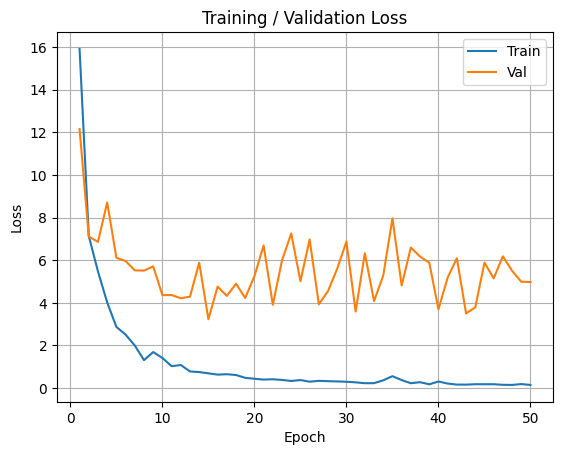

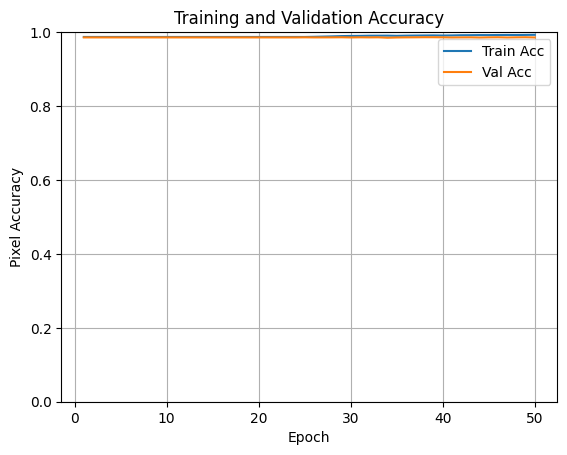

In [ ]:
# Define epochs based on the length of train_loss
epochs = range(1, len(history["train_loss"]) + 1)

# Plot Losses
plt.figure()
plt.plot(epochs, history["train_loss"], label="Train")
val_loss = [loss for loss in history["val_loss"] if loss is not None]
if val_loss:
    val_epochs = range(1, len(val_loss) + 1)
    plt.plot(val_epochs, val_loss, label="Val")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training / Validation Loss")
plt.legend()
plt.grid(True)
plt.show()

# Plot Accuracy
plt.figure()
plt.plot(epochs, history["train_acc"], label="Train Acc")
val_acc = [acc for acc in history["val_acc"] if acc is not None]
if val_acc:
    val_epochs = range(1, len(val_acc) + 1)
    plt.plot(val_epochs, val_acc, label="Val Acc")
plt.xlabel("Epoch")
plt.ylabel("Pixel Accuracy")
plt.title("Training and Validation Accuracy")
plt.ylim(0, 1)
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Print Training and Validation Metrics
print("Training and Validation Metrics per Epoch:")
print("-" * 50)
print(f"{'Epoch':<6} {'Train Loss':<12} {'Val Loss':<12} {'Train Acc':<12} {'Val Acc':<12}")
print("-" * 50)
for epoch, (train_loss, val_loss, train_acc, val_acc) in enumerate(
    zip(history["train_loss"], history["val_loss"], history["train_acc"], history["val_acc"]), 1
):
    val_loss_str = f"{val_loss:.4f}" if val_loss is not None else "N/A"
    val_acc_str = f"{val_acc:.4f}" if val_acc is not None else "N/A"
    print(f"{epoch:<6} {train_loss:<12.4f} {val_loss_str:<12} {train_acc:<12.4f} {val_acc_str:<12}")

Training and Validation Metrics per Epoch:
--------------------------------------------------
Epoch  Train Loss   Val Loss     Train Acc    Val Acc     
--------------------------------------------------
1      15.9071      12.1520      0.9869       0.9857      
2      7.1380       7.1103       0.9869       0.9857      
3      5.4698       6.8589       0.9869       0.9857      
4      4.0195       8.7061       0.9869       0.9857      
5      2.8714       6.1149       0.9869       0.9857      
6      2.5086       5.9588       0.9869       0.9857      
7      1.9973       5.5222       0.9869       0.9857      
8      1.3119       5.5105       0.9869       0.9857      
9      1.6902       5.7080       0.9869       0.9857      
10     1.4132       4.3610       0.9869       0.9857      
11     1.0279       4.3639       0.9869       0.9857      
12     1.0839       4.2159       0.9869       0.9857      
13     0.7817       4.2871       0.9869       0.9857      
14     0.7521       5.8828   

In [ ]:
torch.save(model.state_dict(), '/content/drive/MyDrive/Annotated_Files/lanenet_model.pth')
print("Model saved successfully!")

Model saved successfully!


In [ ]:
from sklearn.cluster import MeanShift
from sklearn.cluster import DBSCAN, KMeans
from sklearn.preprocessing import StandardScaler

In [ ]:
def enhance_nighttime_image(image):
    if image.dtype == np.uint8:
        image = image.astype(np.float32) / 255.0

    lab = cv2.cvtColor((image * 255).astype(np.uint8), cv2.COLOR_RGB2LAB)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    lab[:, :, 0] = clahe.apply(lab[:, :, 0])
    enhanced = cv2.cvtColor(lab, cv2.COLOR_LAB2RGB)
    enhanced = enhanced.astype(np.float32) / 255.0
    enhanced = np.clip(enhanced * 1.2 + 0.1, 0, 1)
    return enhanced

def improved_cluster_embeddings(embedding_features, binary_mask, min_pixels=30, method='dbscan'):

    h, w = binary_mask.shape
    embed_dim = embedding_features.shape[0]

    # Get lane pixels with more lenient threshold
    lane_pixels = binary_mask > 0.3  # Lower threshold for nighttime

    if np.sum(lane_pixels) < min_pixels:
        print(f"Not enough lane pixels: {np.sum(lane_pixels)}")
        return np.zeros_like(binary_mask, dtype=np.int32)

    # Extract embeddings for lane pixels
    lane_coords = np.where(lane_pixels)
    lane_embeddings = embedding_features[:, lane_coords[0], lane_coords[1]].T

    print(f"Lane pixels: {len(lane_embeddings)}, Embedding dim: {embed_dim}")

    # Normalize embeddings for better clustering
    scaler = StandardScaler()
    lane_embeddings_normalized = scaler.fit_transform(lane_embeddings)

    instance_mask = np.zeros_like(binary_mask, dtype=np.int32)

    try:
        if method == 'dbscan':
            # DBSCAN with adaptive parameters
            eps_values = [0.3, 0.5, 0.8, 1.0]
            min_samples_values = [max(5, min_pixels//4), max(10, min_pixels//3), max(15, min_pixels//2)]

            best_labels = None
            best_n_clusters = 0

            for eps in eps_values:
                for min_samples in min_samples_values:
                    clustering = DBSCAN(eps=eps, min_samples=min_samples)
                    labels = clustering.fit_predict(lane_embeddings_normalized)

                    n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
                    if 2 <= n_clusters <= 6:  # Reasonable number of lanes
                        best_labels = labels
                        best_n_clusters = n_clusters
                        print(f"DBSCAN found {n_clusters} clusters with eps={eps}, min_samples={min_samples}")
                        break

                if best_labels is not None:
                    break

            if best_labels is None:
                print("DBSCAN failed, trying KMeans...")
                # Fallback to KMeans
                for n_clusters in [2, 3, 4]:
                    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
                    best_labels = kmeans.fit_predict(lane_embeddings_normalized)
                    print(f"Using KMeans with {n_clusters} clusters")
                    break

            cluster_labels = best_labels

        else:  # KMeans
            # Try different numbers of clusters
            for n_clusters in [2, 3, 4]:
                kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
                cluster_labels = kmeans.fit_predict(lane_embeddings_normalized)
                print(f"KMeans with {n_clusters} clusters")
                break

        # Create instance mask
        unique_labels = np.unique(cluster_labels)
        instance_id = 1

        for label in unique_labels:
            if label == -1:  # Skip noise in DBSCAN
                continue

            cluster_mask = cluster_labels == label
            cluster_size = np.sum(cluster_mask)

            if cluster_size >= min_pixels:
                coords = (lane_coords[0][cluster_mask], lane_coords[1][cluster_mask])
                instance_mask[coords] = instance_id
                print(f"Instance {instance_id}: {cluster_size} pixels")
                instance_id += 1

        print(f"Total instances created: {instance_id - 1}")
        return instance_mask

    except Exception as e:
        print(f"Clustering failed: {e}")
        # Final fallback: create simple instances based on spatial proximity
        return create_spatial_instances(binary_mask, min_pixels)

def create_spatial_instances(binary_mask, min_pixels=30):
    """
    Fallback method: create instances based on connected components
    """
    try:
        # Find connected components
        binary_uint8 = (binary_mask > 0.3).astype(np.uint8)
        num_labels, labels = cv2.connectedComponents(binary_uint8)

        instance_mask = np.zeros_like(binary_mask, dtype=np.int32)
        instance_id = 1

        for label in range(1, num_labels):  # Skip background (0)
            component_mask = labels == label
            if np.sum(component_mask) >= min_pixels:
                instance_mask[component_mask] = instance_id
                instance_id += 1

        print(f"Spatial clustering created {instance_id - 1} instances")
        return instance_mask

    except Exception as e:
        print(f"Spatial clustering failed: {e}")
        return np.zeros_like(binary_mask, dtype=np.int32)

def debug_embeddings(embedding_features, binary_mask):
    """
    Debug function to analyze embedding features
    """
    print(f"Embedding shape: {embedding_features.shape}")
    print(f"Binary mask shape: {binary_mask.shape}")
    print(f"Binary mask range: [{binary_mask.min():.3f}, {binary_mask.max():.3f}]")
    print(f"Binary mask > 0.5: {np.sum(binary_mask > 0.5)} pixels")
    print(f"Binary mask > 0.3: {np.sum(binary_mask > 0.3)} pixels")

    # Check embedding statistics
    lane_pixels = binary_mask > 0.3
    if np.sum(lane_pixels) > 0:
        lane_embeddings = embedding_features[:, lane_pixels]
        print(f"Embedding range: [{lane_embeddings.min():.3f}, {lane_embeddings.max():.3f}]")
        print(f"Embedding std: {lane_embeddings.std(axis=1)}")
    else:
        print("No lane pixels found!")

def improved_visualize_instances(instance_mask, min_area=50):
    """
    Improved instance visualization with better color mapping
    """
    if instance_mask.max() == 0:
        print("No instances to visualize")
        return np.zeros((*instance_mask.shape, 3))

    # Filter out small instances
    filtered_mask = np.zeros_like(instance_mask)
    instance_id = 1

    for orig_id in range(1, instance_mask.max() + 1):
        mask = instance_mask == orig_id
        if np.sum(mask) >= min_area:
            filtered_mask[mask] = instance_id
            instance_id += 1

    if filtered_mask.max() == 0:
        print("No instances large enough after filtering")
        return np.zeros((*instance_mask.shape, 3))

    # Create distinct colors for each instance
    colors = [
        [1.0, 0.0, 0.0],    # Red
        [0.0, 1.0, 0.0],    # Green
        [0.0, 0.0, 1.0],    # Blue
        [1.0, 1.0, 0.0],    # Yellow
        [1.0, 0.0, 1.0],    # Magenta
        [0.0, 1.0, 1.0],    # Cyan
        [1.0, 0.5, 0.0],    # Orange
        [0.5, 0.0, 1.0],    # Purple
    ]

    # Create RGB image
    rgb_image = np.zeros((*filtered_mask.shape, 3))

    for instance_id in range(1, filtered_mask.max() + 1):
        mask = filtered_mask == instance_id
        color = colors[(instance_id - 1) % len(colors)]
        rgb_image[mask] = color
        print(f"Visualizing instance {instance_id} with {np.sum(mask)} pixels in color {color}")

    return rgb_image

def create_nighttime_overlay(image, binary_pred, instance_pred, alpha=0.6):
    """Create overlay with bright colors for nighttime visibility"""
    overlay = image.copy()

    if instance_pred.max() > 0:
        colors = [
            [1.0, 0.0, 0.0],    # Bright red
            [0.0, 1.0, 0.0],    # Bright green
            [0.0, 0.5, 1.0],    # Bright blue
            [1.0, 1.0, 0.0],    # Yellow
            [1.0, 0.0, 1.0],    # Magenta
            [0.0, 1.0, 1.0],    # Cyan
        ]

        for instance_id in range(1, instance_pred.max() + 1):
            mask = instance_pred == instance_id
            color = colors[(instance_id - 1) % len(colors)]

            for c in range(3):
                overlay[mask, c] = overlay[mask, c] * (1 - alpha) + color[c] * alpha

    # Add bright outline
    binary_edges = cv2.Canny((binary_pred * 255).astype(np.uint8), 50, 150)
    edge_mask = binary_edges > 0
    overlay[edge_mask] = [1.0, 1.0, 1.0]  # White edges

    return np.clip(overlay, 0, 1)

In [ ]:
def enhanced_visualize_lanenet_prediction(image, binary_gt, instance_gt, binary_pred, embedding_pred,
                                        save_path=None, title_prefix="", enhance_nighttime=True):
    """
    Enhanced visualization with better debugging and instance handling
    """
    try:
        # Convert tensors to numpy arrays
        if isinstance(image, torch.Tensor):
            image = image.permute(1, 2, 0).cpu().numpy()
            image = np.clip(image, 0, 1)

        if isinstance(binary_gt, torch.Tensor):
            binary_gt = binary_gt.cpu().numpy()

        if isinstance(instance_gt, torch.Tensor):
            instance_gt = instance_gt.cpu().numpy()

        if isinstance(binary_pred, torch.Tensor):
            if binary_pred.dim() == 3 and binary_pred.shape[0] == 1:
                binary_pred = binary_pred.squeeze(0)
            binary_pred = binary_pred.cpu().numpy()

        if isinstance(embedding_pred, torch.Tensor):
            embedding_pred = embedding_pred.cpu().numpy()

        print("\n" + "="*50)
        print(f"Visualizing {title_prefix}")
        print("="*50)

        # Debug embeddings
        debug_embeddings(embedding_pred, binary_pred)

        # Apply nighttime enhancement to the original image
        enhanced_image = image.copy()
        if enhance_nighttime:
            enhanced_image = enhance_nighttime_image(enhanced_image)

        # Generate instance prediction from embeddings with multiple methods
        print("\nTrying DBSCAN clustering...")
        instance_pred_dbscan = improved_cluster_embeddings(embedding_pred, binary_pred, method='dbscan')

        print("\nTrying KMeans clustering...")
        instance_pred_kmeans = improved_cluster_embeddings(embedding_pred, binary_pred, method='kmeans')

        # Choose the best result
        if instance_pred_dbscan.max() > 0:
            instance_pred = instance_pred_dbscan
            method_used = "DBSCAN"
        elif instance_pred_kmeans.max() > 0:
            instance_pred = instance_pred_kmeans
            method_used = "KMeans"
        else:
            instance_pred = create_spatial_instances(binary_pred)
            method_used = "Spatial"

        print(f"\nUsing {method_used} method, found {instance_pred.max()} instances")

        # Create visualization
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        fig.suptitle(f'{title_prefix}Lane Detection Results ({method_used})', fontsize=16, color='white')
        fig.patch.set_facecolor('black')

        # Row 1: Original comparisons
        axes[0, 0].imshow(enhanced_image)
        axes[0, 0].set_title('Enhanced Input Image', color='white', fontsize=12)
        axes[0, 0].axis('off')

        # Ground truth binary mask
        axes[0, 1].imshow(binary_gt, cmap='hot', alpha=0.8)
        axes[0, 1].imshow(image, alpha=0.3)
        axes[0, 1].set_title(f'GT Binary (Max: {binary_gt.max():.3f})', color='white', fontsize=12)
        axes[0, 1].axis('off')

        # Predicted binary mask
        axes[0, 2].imshow(binary_pred, cmap='hot', alpha=0.8, vmin=0, vmax=1)
        axes[0, 2].imshow(image, alpha=0.3)
        axes[0, 2].set_title(f'Pred Binary (Max: {binary_pred.max():.3f})', color='white', fontsize=12)
        axes[0, 2].axis('off')

        # Row 2: Instance segmentation and overlays
        # Ground truth instances
        gt_vis = improved_visualize_instances(instance_gt.astype(np.int32))
        axes[1, 0].imshow(gt_vis)
        axes[1, 0].set_title(f'GT Instances ({instance_gt.max()} instances)', color='white', fontsize=12)
        axes[1, 0].axis('off')

        # Predicted instances
        pred_vis = improved_visualize_instances(instance_pred)
        axes[1, 1].imshow(pred_vis)
        axes[1, 1].set_title(f'Pred Instances ({instance_pred.max()} instances)', color='white', fontsize=12)
        axes[1, 1].axis('off')

        # Final overlay
        if instance_pred.max() > 0:
            overlay = create_nighttime_overlay(enhanced_image, binary_pred, instance_pred)
        else:
            # Fallback: just show binary prediction
            overlay = enhanced_image.copy()
            binary_colored = np.zeros_like(overlay)
            binary_colored[:, :, 0] = binary_pred  # Red channel
            overlay = np.clip(overlay * 0.7 + binary_colored * 0.3, 0, 1)

        axes[1, 2].imshow(overlay)
        axes[1, 2].set_title('Final Detection Overlay', color='white', fontsize=12)
        axes[1, 2].axis('off')

        # Style all subplots for dark theme
        for ax in axes.flat:
            ax.set_facecolor('black')
            for spine in ax.spines.values():
                spine.set_color('white')

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight',
                       facecolor='black', edgecolor='white')
            print(f"Visualization saved to: {save_path}")

        plt.show()

    except Exception as e:
        print(f"Error in visualization: {e}")
        import traceback
        traceback.print_exc()

def enhanced_test_model_with_visualization(model, test_loader, criterion, device,
                                         max_samples=10, save_dir="./results/"):
    """Enhanced testing with better instance prediction debugging"""
    model = model.to(device)
    model.eval()

    print(f"Model device: {next(model.parameters()).device}")
    print(f"Target device: {device}")

    with torch.no_grad():
        for i, batch_data in enumerate(test_loader):
            if i >= max_samples:
                break

            try:
                if hasattr(model, 'lanenet') and 'images' in batch_data:  # LSTM model
                    images = batch_data['images'].to(device)
                    binary_gt = batch_data['binary_masks'][:, -1]
                    instance_gt = batch_data['instance_masks'][:, -1]

                    binary_pred, embedding_pred, _, _ = model(images)
                    input_image = images[0, -1]
                else:
                    images = batch_data['image'].to(device)
                    binary_gt = batch_data['binary_mask']
                    instance_gt = batch_data['instance_mask']

                    binary_pred, embedding_pred = model(images)
                    input_image = images[0]

                # Create enhanced visualization
                save_path = f"{save_dir}/enhanced_lane_result_{i:03d}.png"

                enhanced_visualize_lanenet_prediction(
                    image=input_image,
                    binary_gt=binary_gt[0],
                    instance_gt=instance_gt[0],
                    binary_pred=binary_pred[0],
                    embedding_pred=embedding_pred[0],
                    save_path=save_path,
                    title_prefix=f"Sample {i+1}: ",
                    enhance_nighttime=True
                )

                print(f"Processed sample {i+1}/{max_samples}")

            except Exception as e:
                print(f"Error processing sample {i}: {e}")
                import traceback
                traceback.print_exc()
                continue

In [ ]:
os.makedirs("/content/drive/MyDrive/Annotated_Files/Output/nighttime_results_2/", exist_ok=True)

Model device: cpu
Target device: cpu

Visualizing Sample 1: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.754]
Binary mask > 0.5: 340 pixels
Binary mask > 0.3: 506 pixels
Embedding range: [-7.962, 7.786]
Embedding std: [3.3396235 3.4094543 3.2167091 3.3400745]

Trying DBSCAN clustering...
Lane pixels: 506, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 252 pixels
Instance 2: 142 pixels
Instance 3: 112 pixels
Total instances created: 3

Trying KMeans clustering...
Lane pixels: 506, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 254 pixels
Instance 2: 252 pixels
Total instances created: 2

Using DBSCAN method, found 3 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 126 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 4 with 161 pixels in color [1.0, 1.0, 0.0]
Visualizing instance 1 with

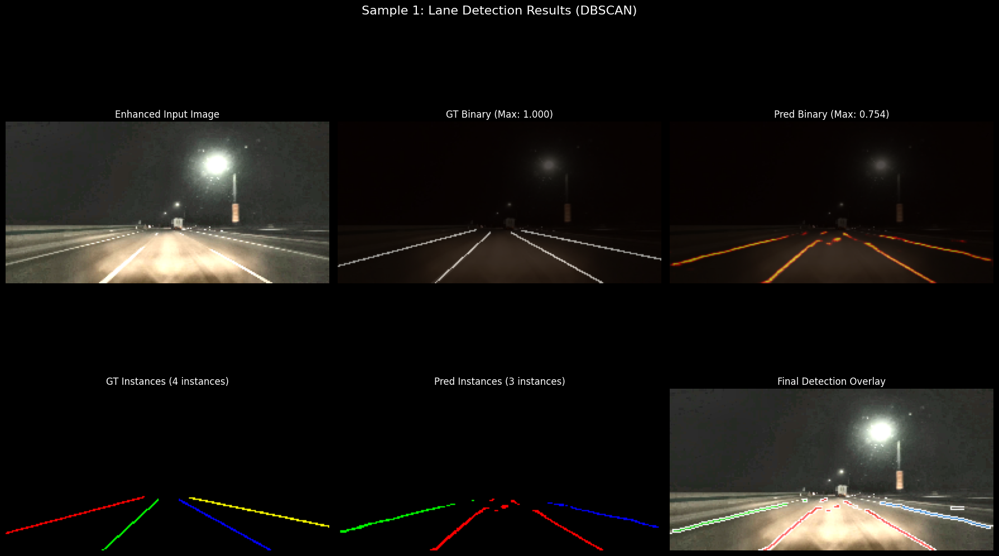

Processed sample 1/20

Visualizing Sample 2: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.752]
Binary mask > 0.5: 332 pixels
Binary mask > 0.3: 516 pixels
Embedding range: [-7.981, 7.788]
Embedding std: [3.280857  3.3496046 3.160238  3.2815003]

Trying DBSCAN clustering...
Lane pixels: 516, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 251 pixels
Instance 2: 149 pixels
Instance 3: 116 pixels
Total instances created: 3

Trying KMeans clustering...
Lane pixels: 516, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 251 pixels
Instance 2: 265 pixels
Total instances created: 2

Using DBSCAN method, found 3 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 126 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 4 with 161 pixels in color [1.0, 1.0, 0.0]
Visualizing instance 1 with 251 pixels in 

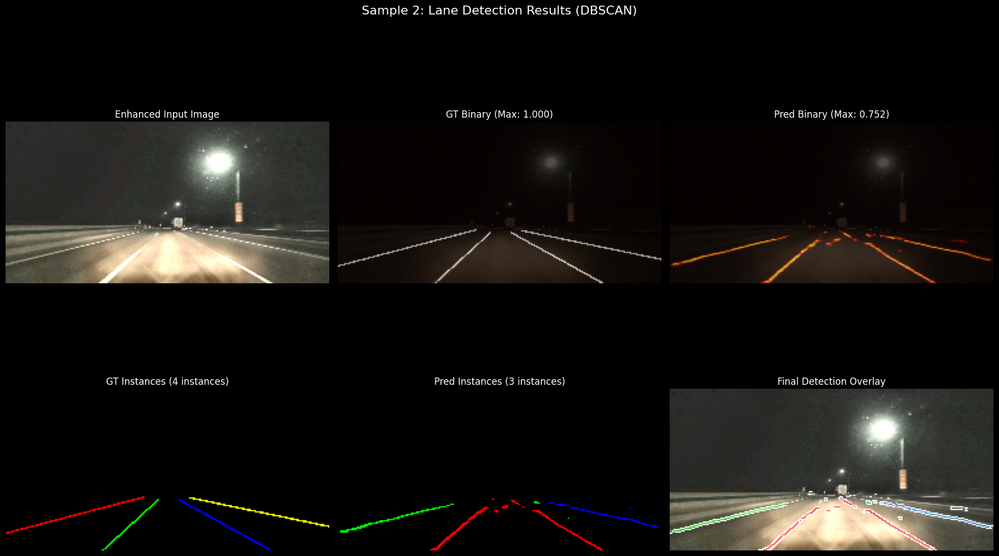

Processed sample 2/20

Visualizing Sample 3: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.752]
Binary mask > 0.5: 285 pixels
Binary mask > 0.3: 467 pixels
Embedding range: [-7.995, 7.820]
Embedding std: [3.3368979 3.4067678 3.2141933 3.3368154]

Trying DBSCAN clustering...
Lane pixels: 467, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 201 pixels
Instance 2: 147 pixels
Instance 3: 110 pixels
Total instances created: 3

Trying KMeans clustering...
Lane pixels: 467, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 257 pixels
Instance 2: 210 pixels
Total instances created: 2

Using DBSCAN method, found 3 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 126 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 4 with 161 pixels in color [1.0, 1.0, 0.0]
Visualizing instance 1 with 201 pixels in 

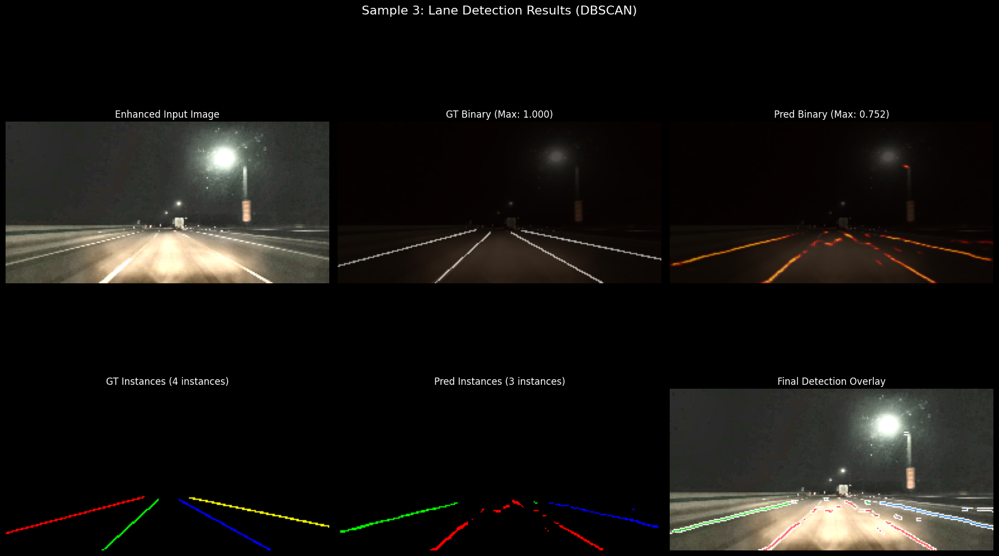

Processed sample 3/20

Visualizing Sample 4: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.752]
Binary mask > 0.5: 235 pixels
Binary mask > 0.3: 414 pixels
Embedding range: [-7.906, 7.725]
Embedding std: [3.4381218 3.5084999 3.3110113 3.4365456]

Trying DBSCAN clustering...
Lane pixels: 414, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 92 pixels
Instance 2: 143 pixels
Instance 3: 109 pixels
Instance 4: 70 pixels
Total instances created: 4

Trying KMeans clustering...
Lane pixels: 414, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 252 pixels
Instance 2: 162 pixels
Total instances created: 2

Using DBSCAN method, found 4 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 126 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 4 with 161 pixels in color [1.0, 1.0, 0.0]
Visualizing instance 

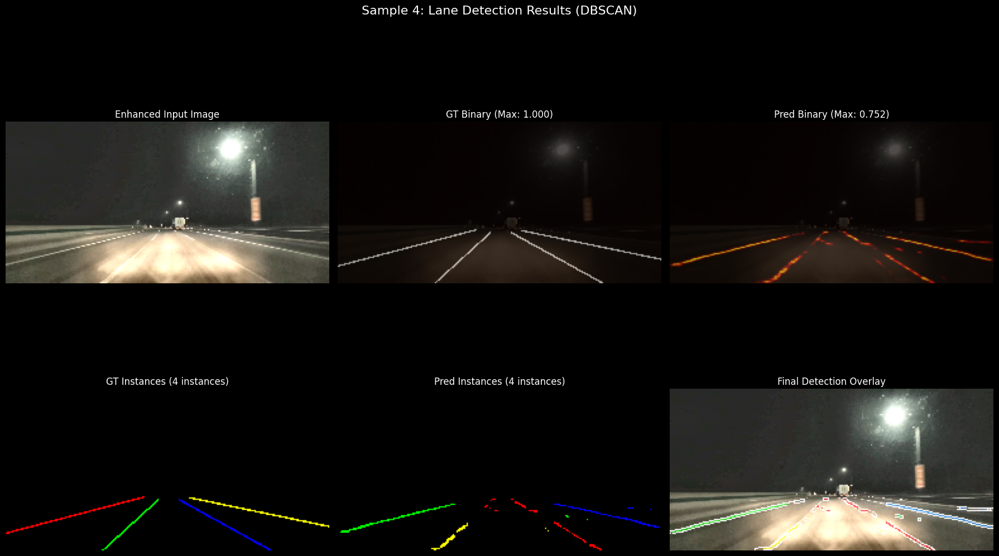

Processed sample 4/20

Visualizing Sample 5: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.752]
Binary mask > 0.5: 242 pixels
Binary mask > 0.3: 435 pixels
Embedding range: [-7.822, 7.631]
Embedding std: [3.397548  3.467526  3.2724488 3.3956118]

Trying DBSCAN clustering...
Lane pixels: 435, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 115 pixels
Instance 2: 136 pixels
Instance 3: 110 pixels
Instance 4: 71 pixels
Total instances created: 4

Trying KMeans clustering...
Lane pixels: 435, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 246 pixels
Instance 2: 189 pixels
Total instances created: 2

Using DBSCAN method, found 4 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 126 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 4 with 161 pixels in color [1.0, 1.0, 0.0]
Visualizing instance

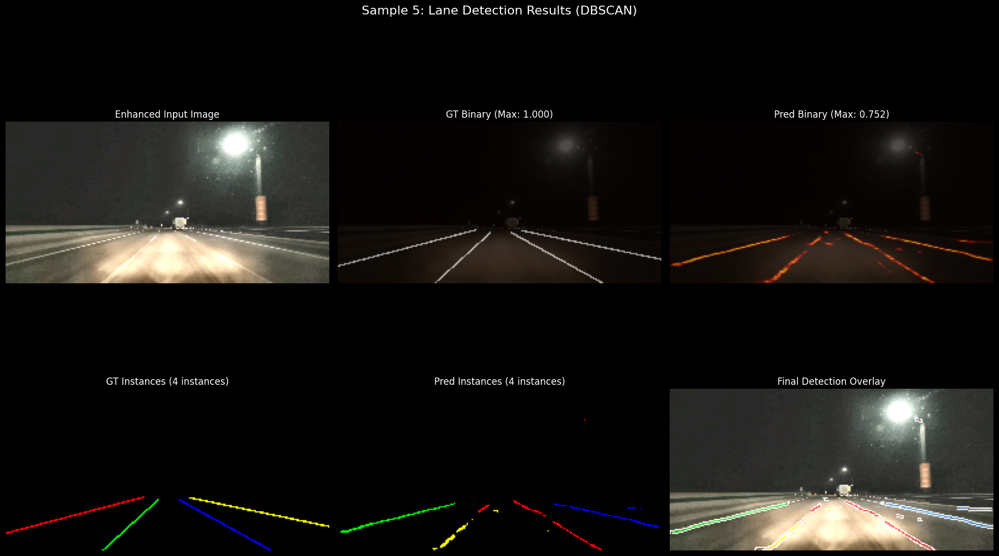

Processed sample 5/20

Visualizing Sample 6: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.759]
Binary mask > 0.5: 266 pixels
Binary mask > 0.3: 461 pixels
Embedding range: [-7.651, 7.460]
Embedding std: [3.5563247 3.6293736 3.4255962 3.5538633]

Trying DBSCAN clustering...
Lane pixels: 461, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 128 pixels
Instance 2: 135 pixels
Instance 3: 123 pixels
Instance 4: 72 pixels
Total instances created: 4

Trying KMeans clustering...
Lane pixels: 461, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 258 pixels
Instance 2: 203 pixels
Total instances created: 2

Using DBSCAN method, found 4 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 126 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 4 with 161 pixels in color [1.0, 1.0, 0.0]
Visualizing instance

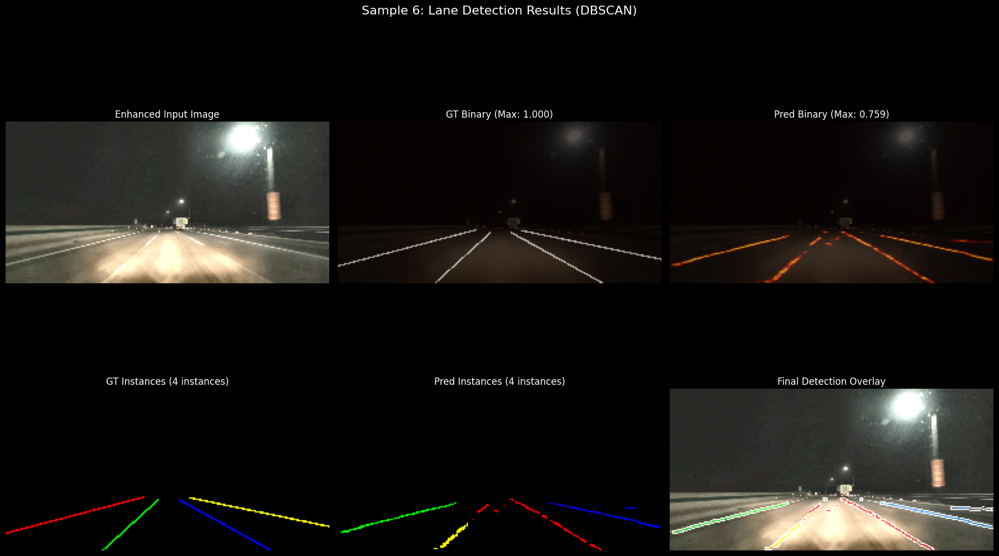

Processed sample 6/20

Visualizing Sample 7: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.767]
Binary mask > 0.5: 284 pixels
Binary mask > 0.3: 450 pixels
Embedding range: [-7.460, 7.271]
Embedding std: [3.536378  3.6094103 3.4065344 3.534521 ]

Trying DBSCAN clustering...
Lane pixels: 450, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 133 pixels
Instance 2: 112 pixels
Instance 3: 129 pixels
Instance 4: 74 pixels
Total instances created: 4

Trying KMeans clustering...
Lane pixels: 450, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 242 pixels
Instance 2: 208 pixels
Total instances created: 2

Using DBSCAN method, found 4 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 124 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 4 with 161 pixels in color [1.0, 1.0, 0.0]
Visualizing instance

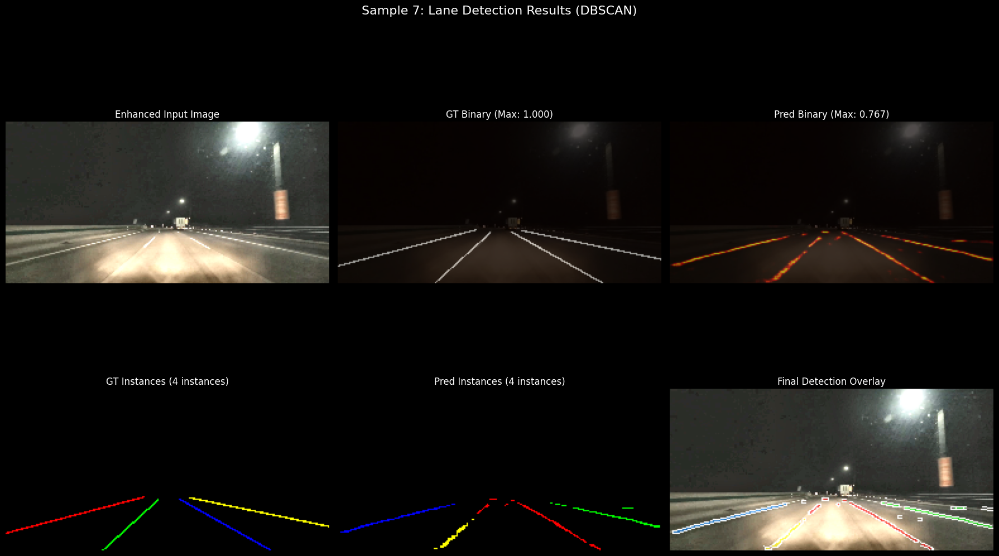

Processed sample 7/20

Visualizing Sample 8: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.768]
Binary mask > 0.5: 344 pixels
Binary mask > 0.3: 516 pixels
Embedding range: [-7.365, 7.187]
Embedding std: [3.6753628 3.7514863 3.5402677 3.6740017]

Trying DBSCAN clustering...
Lane pixels: 516, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 248 pixels
Instance 2: 133 pixels
Instance 3: 132 pixels
Total instances created: 3

Trying KMeans clustering...
Lane pixels: 516, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 265 pixels
Instance 2: 251 pixels
Total instances created: 2

Using DBSCAN method, found 3 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 124 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 4 with 161 pixels in color [1.0, 1.0, 0.0]
Visualizing instance 1 with 248 pixels in 

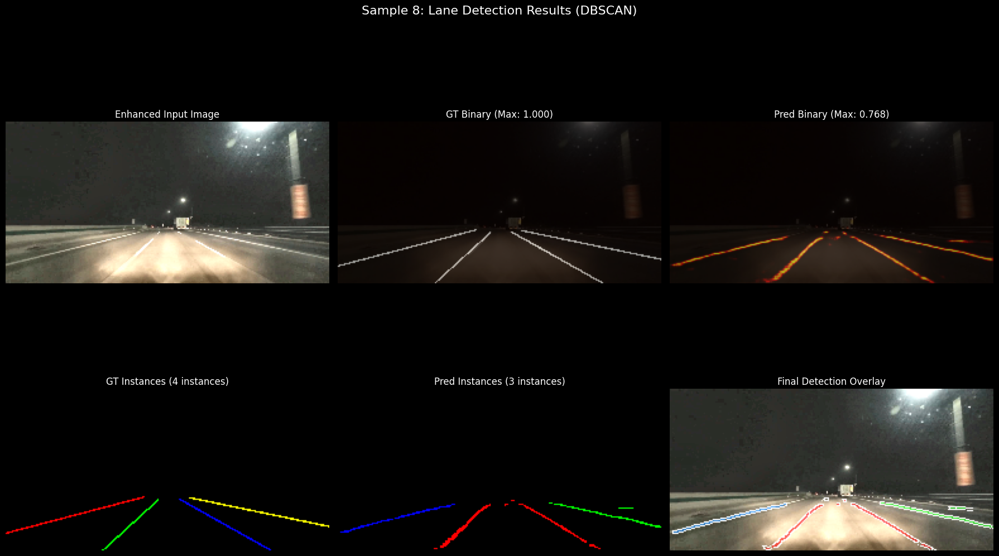

Processed sample 8/20

Visualizing Sample 9: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.768]
Binary mask > 0.5: 366 pixels
Binary mask > 0.3: 538 pixels
Embedding range: [-7.537, 7.368]
Embedding std: [3.6730323 3.7501302 3.5385115 3.672348 ]

Trying DBSCAN clustering...
Lane pixels: 538, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 278 pixels
Instance 2: 129 pixels
Instance 3: 125 pixels
Total instances created: 3

Trying KMeans clustering...
Lane pixels: 538, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 254 pixels
Instance 2: 284 pixels
Total instances created: 2

Using DBSCAN method, found 3 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 124 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 4 with 161 pixels in color [1.0, 1.0, 0.0]
Visualizing instance 1 with 278 pixels in 

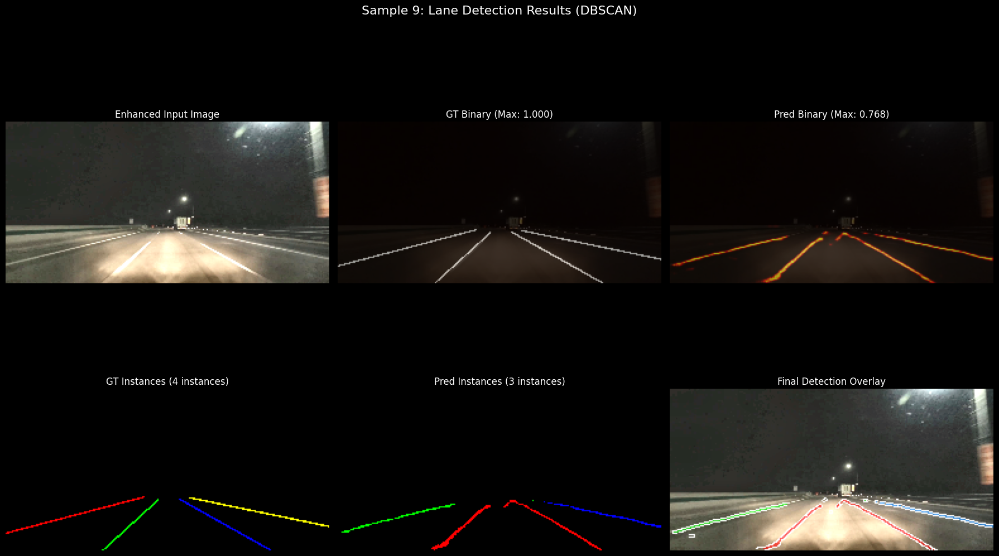

Processed sample 9/20

Visualizing Sample 10: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.769]
Binary mask > 0.5: 380 pixels
Binary mask > 0.3: 516 pixels
Embedding range: [-7.610, 7.404]
Embedding std: [3.6656997 3.7417994 3.5305762 3.6650386]

Trying DBSCAN clustering...
Lane pixels: 516, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 268 pixels
Instance 2: 119 pixels
Instance 3: 128 pixels
Total instances created: 3

Trying KMeans clustering...
Lane pixels: 516, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 247 pixels
Instance 2: 269 pixels
Total instances created: 2

Using DBSCAN method, found 3 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 124 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 4 with 161 pixels in color [1.0, 1.0, 0.0]
Visualizing instance 1 with 268 pixels in

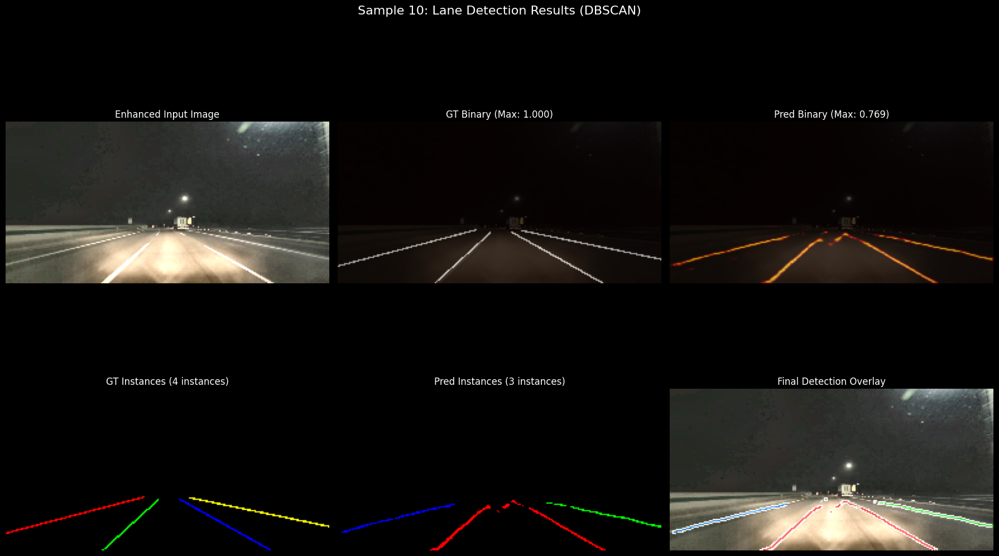

Processed sample 10/20

Visualizing Sample 11: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.772]
Binary mask > 0.5: 378 pixels
Binary mask > 0.3: 527 pixels
Embedding range: [-7.507, 7.303]
Embedding std: [3.633556  3.708248  3.4988923 3.6316695]

Trying DBSCAN clustering...
Lane pixels: 527, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 252 pixels
Instance 2: 154 pixels
Instance 3: 121 pixels
Total instances created: 3

Trying KMeans clustering...
Lane pixels: 527, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 275 pixels
Instance 2: 252 pixels
Total instances created: 2

Using DBSCAN method, found 3 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 124 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 4 with 161 pixels in color [1.0, 1.0, 0.0]
Visualizing instance 1 with 252 pixels i

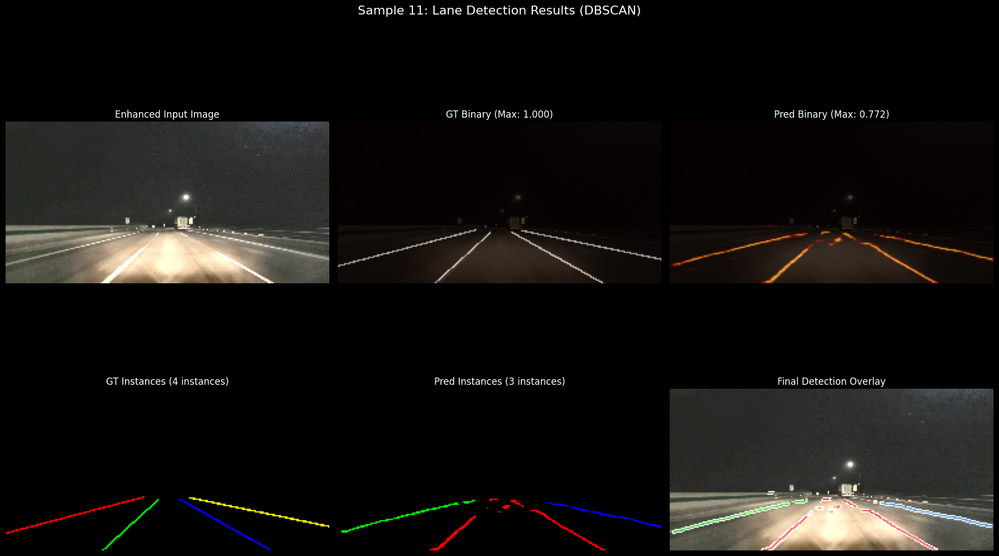

Processed sample 11/20

Visualizing Sample 12: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.752]
Binary mask > 0.5: 138 pixels
Binary mask > 0.3: 226 pixels
Embedding range: [-5.285, 5.163]
Embedding std: [2.3937514 2.442405  2.3035831 2.3953795]

Trying DBSCAN clustering...
Lane pixels: 226, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 125 pixels
Instance 2: 97 pixels
Total instances created: 2

Trying KMeans clustering...
Lane pixels: 226, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 101 pixels
Instance 2: 125 pixels
Total instances created: 2

Using DBSCAN method, found 2 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 87 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 135 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 1 with 125 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 97 pixels in color [0.0, 1.0, 0.0]
V

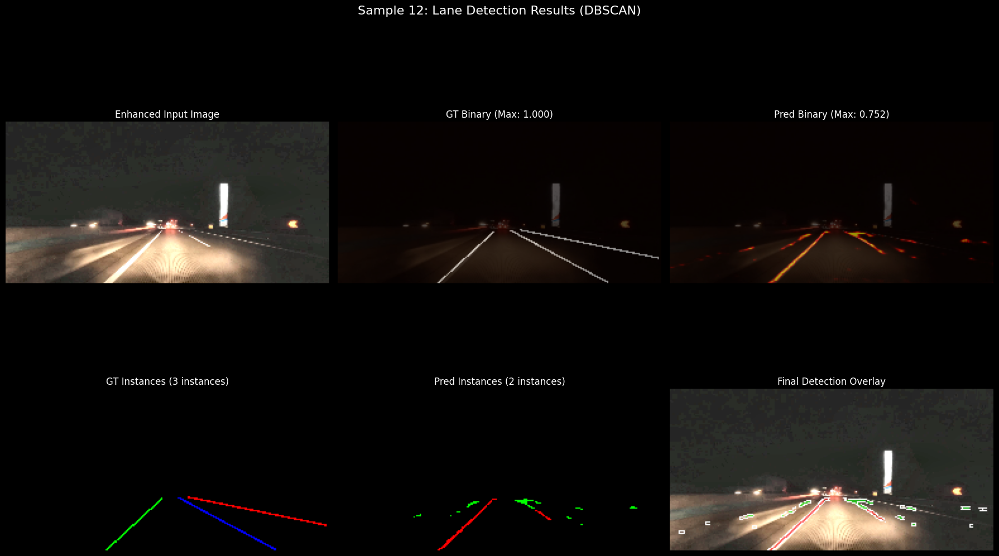

Processed sample 12/20

Visualizing Sample 13: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.751]
Binary mask > 0.5: 129 pixels
Binary mask > 0.3: 201 pixels
Embedding range: [-5.472, 5.342]
Embedding std: [2.0796084 2.123155  2.0019038 2.0807734]

Trying DBSCAN clustering...
Lane pixels: 201, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 152 pixels
Total instances created: 1

Trying KMeans clustering...
Lane pixels: 201, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 164 pixels
Instance 2: 37 pixels
Total instances created: 2

Using DBSCAN method, found 1 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 87 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 135 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 1 with 152 pixels in color [1.0, 0.0, 0.0]
Visualization saved to: /content/drive/MyDrive/Annotated_Files/Output/nighttime_results

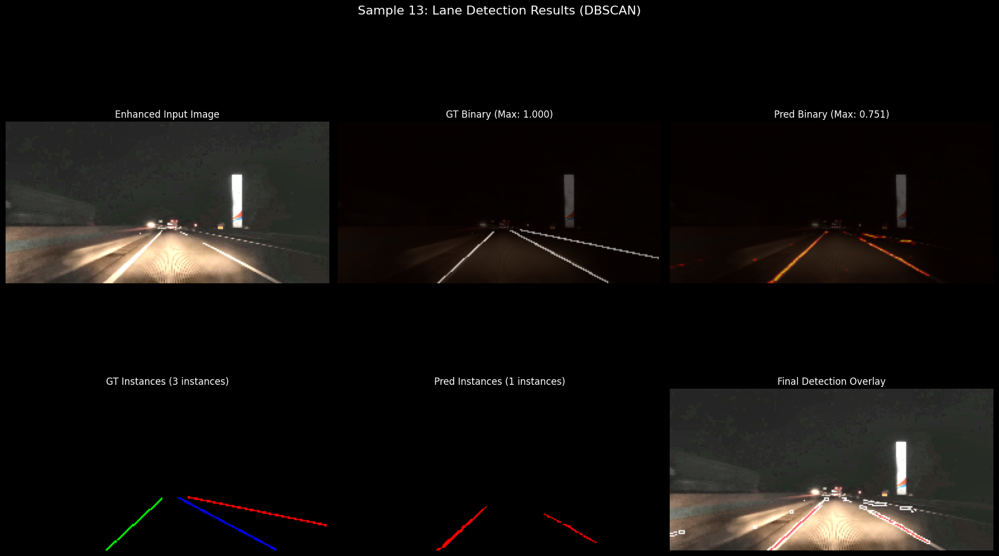

Processed sample 13/20

Visualizing Sample 14: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.751]
Binary mask > 0.5: 109 pixels
Binary mask > 0.3: 192 pixels
Embedding range: [-7.026, 6.869]
Embedding std: [3.0292664 3.0901575 2.9162517 3.0296504]

Trying DBSCAN clustering...
Lane pixels: 192, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 70 pixels
Instance 2: 117 pixels
Total instances created: 2

Trying KMeans clustering...
Lane pixels: 192, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 72 pixels
Instance 2: 120 pixels
Total instances created: 2

Using DBSCAN method, found 2 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 83 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 135 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 1 with 70 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 117 pixels in color [0.0, 1.0, 0.0]
Vi

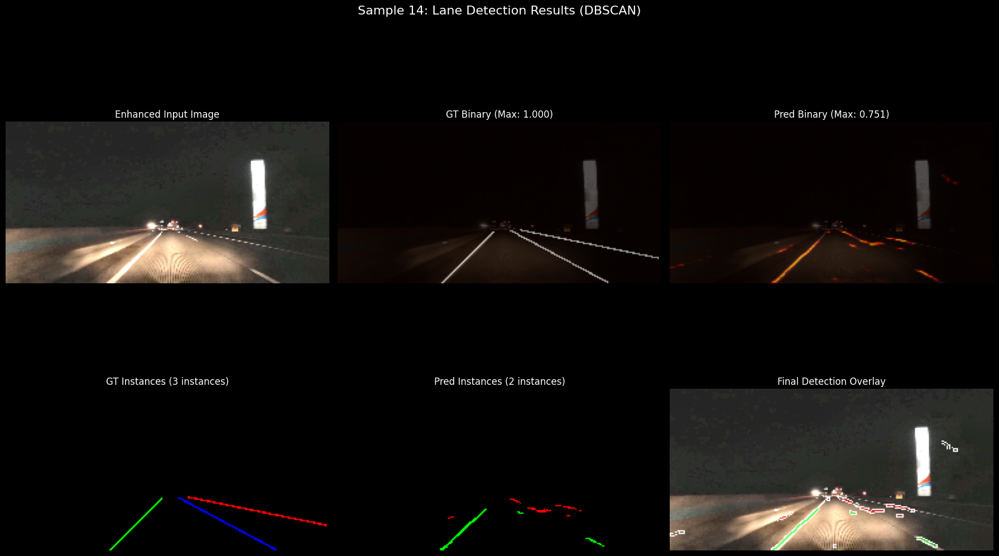

Processed sample 14/20

Visualizing Sample 15: 
Embedding shape: (4, 128, 256)
Binary mask shape: (128, 256)
Binary mask range: [0.000, 0.751]
Binary mask > 0.5: 79 pixels
Binary mask > 0.3: 148 pixels
Embedding range: [-7.053, 6.883]
Embedding std: [1.7651926 1.8027265 1.700055  1.7667105]

Trying DBSCAN clustering...
Lane pixels: 148, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 116 pixels
Total instances created: 1

Trying KMeans clustering...
Lane pixels: 148, Embedding dim: 4
KMeans with 2 clusters
Instance 1: 117 pixels
Instance 2: 31 pixels
Total instances created: 2

Using DBSCAN method, found 1 instances
Visualizing instance 1 with 164 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 87 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 133 pixels in color [0.0, 0.0, 1.0]
Visualizing instance 1 with 116 pixels in color [1.0, 0.0, 0.0]
Visualization saved to: /content/drive/MyDrive/Annotated_Files/Output/nighttime_results_

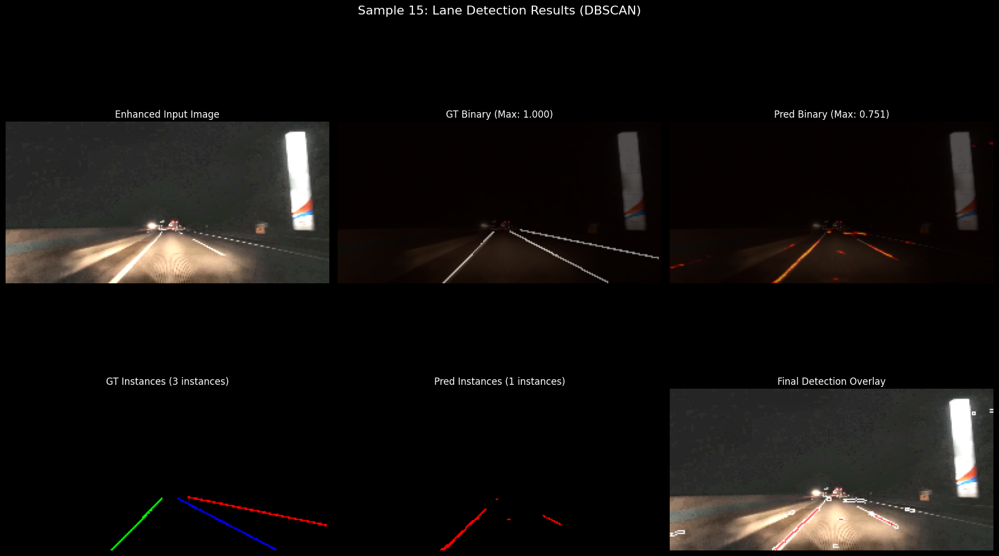

Processed sample 15/20


In [ ]:
enhanced_test_model_with_visualization(
    model=model,
    test_loader=test_loader,
    criterion=criterion,
    device=config.device,
    max_samples=20,
    save_dir="/content/drive/MyDrive/Annotated_Files/Output/nighttime_results_2/"
)

VIDEO PROCESSING

In [ ]:
from collections import deque

In [ ]:
def preprocess_frame_for_model(frame, target_size=(256, 128)):
    """
    Preprocess a single video frame for the model
    """
    # Resize frame to model input size
    frame_resized = cv2.resize(frame, target_size)

    # Convert BGR to RGB
    frame_rgb = cv2.cvtColor(frame_resized, cv2.COLOR_BGR2RGB)

    # Normalize to [0, 1]
    frame_normalized = frame_rgb.astype(np.float32) / 255.0

    return frame_normalized

In [ ]:
def create_video_batch(frames, sequence_length=3):

    # Convert frames to tensors and stack
    frame_tensors = []
    for frame in frames:
        # Convert to tensor and permute to (C, H, W)
        tensor = torch.from_numpy(frame).permute(2, 0, 1)
        frame_tensors.append(tensor)

    # Stack frames for sequence
    sequence_tensor = torch.stack(frame_tensors)  # (T, C, H, W)

    # Add batch dimension: (1, C, T, H, W) for LSTM
    batch_tensor = sequence_tensor.unsqueeze(0).permute(0, 2, 1, 3, 4)

    return batch_tensor

In [ ]:
def test_model_on_video(model, video_path, device, save_dir="./video_results/",
                       sequence_length=3, target_size=(256, 128), max_frames=None,
                       save_video=True, save_frames=True):

    # Create save directory
    os.makedirs(save_dir, exist_ok=True)

    # Open video
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError(f"Could not open video file: {video_path}")

    # Get video properties
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    original_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    original_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    print(f"Video properties:")
    print(f"  - FPS: {fps}")
    print(f"  - Total frames: {total_frames}")
    print(f"  - Original size: {original_width}x{original_height}")
    print(f"  - Target size: {target_size[0]}x{target_size[1]}")

    # Limit frames if specified
    if max_frames:
        total_frames = min(total_frames, max_frames)

    # Initialize video writer for output
    if save_video:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        out_video = cv2.VideoWriter(
            os.path.join(save_dir, 'lane_detection_output.mp4'),
            fourcc, fps, (target_size[0] * 3, target_size[1] * 2)  # 3x2 grid
        )

    model.eval()
    model = model.to(device)

    frame_buffer = []  # Buffer to store frames for sequence
    processed_frames = []

    with torch.no_grad():
        pbar = tqdm(total=total_frames, desc="Processing video frames")

        for frame_idx in range(total_frames):
            ret, frame = cap.read()
            if not ret:
                print(f"Could not read frame {frame_idx}")
                break

            # Preprocess frame
            processed_frame = preprocess_frame_for_model(frame, target_size)
            frame_buffer.append(processed_frame)

            # Once we have enough frames for a sequence
            if len(frame_buffer) >= sequence_length:
                # Create batch for model
                batch_tensor = create_video_batch(frame_buffer[-sequence_length:], sequence_length)
                batch_tensor = batch_tensor.to(device)

                try:
                    # Get model predictions
                    if hasattr(model, 'lanenet'):  # LSTM model
                        binary_pred, embedding_pred, _, _ = model(batch_tensor)
                    else:  # Simple model
                        binary_pred, embedding_pred = model(batch_tensor)

                    # Use the last frame's prediction (most recent)
                    current_frame = frame_buffer[-1]
                    current_binary = binary_pred[0, -1] if binary_pred.dim() == 4 else binary_pred[0]
                    current_embedding = embedding_pred[0, :, -1] if embedding_pred.dim() == 5 else embedding_pred[0]

                    # Generate instance prediction
                    instance_pred = improved_cluster_embeddings(
                        current_embedding.cpu().numpy(),
                        current_binary.cpu().numpy(),
                        method='dbscan'
                    )

                    # Create visualization
                    viz_frame = create_video_visualization(
                        current_frame,
                        current_binary.cpu().numpy(),
                        instance_pred,
                        frame_idx
                    )

                    processed_frames.append(viz_frame)

                    # Save individual frame if requested
                    if save_frames and frame_idx % 10 == 0:  # Save every 10th frame
                        frame_path = os.path.join(save_dir, f'frame_{frame_idx:06d}.png')
                        cv2.imwrite(frame_path, (viz_frame * 255).astype(np.uint8))

                    # Write to output video
                    if save_video:
                        out_video.write((viz_frame * 255).astype(np.uint8))

                except Exception as e:
                    print(f"Error processing frame {frame_idx}: {e}")
                    continue

            pbar.update(1)

        pbar.close()

    # Cleanup
    cap.release()
    if save_video:
        out_video.release()

    print(f"\nVideo processing complete!")
    print(f"Results saved to: {save_dir}")
    if save_video:
        print(f"Output video: {os.path.join(save_dir, 'lane_detection_output.mp4')}")

    return processed_frames


In [ ]:
def create_video_visualization(image, binary_pred, instance_pred, frame_idx):
    """
    Create a visualization frame for video output
    """
    # Apply nighttime enhancement
    enhanced_image = enhance_nighttime_image(image)

    # Create overlay
    if instance_pred.max() > 0:
        overlay = create_nighttime_overlay(enhanced_image, binary_pred, instance_pred)
    else:
        # Fallback: just show binary prediction
        overlay = enhanced_image.copy()
        binary_colored = np.zeros_like(overlay)
        binary_colored[:, :, 0] = binary_pred  # Red channel
        overlay = np.clip(enhanced_image * 0.7 + binary_colored * 0.3, 0, 1)

    # Create a 3x2 grid visualization
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    fig.patch.set_facecolor('black')

    # Original image
    axes[0, 0].imshow(image)
    axes[0, 0].set_title('Original', color='white', fontsize=10)
    axes[0, 0].axis('off')

    # Enhanced image
    axes[0, 1].imshow(enhanced_image)
    axes[0, 1].set_title('Enhanced', color='white', fontsize=10)
    axes[0, 1].axis('off')

    # Binary prediction
    axes[0, 2].imshow(binary_pred, cmap='hot')
    axes[0, 2].set_title(f'Binary (Max: {binary_pred.max():.2f})', color='white', fontsize=10)
    axes[0, 2].axis('off')

    # Instance visualization
    instance_vis = improved_visualize_instances(instance_pred)
    axes[1, 0].imshow(instance_vis)
    axes[1, 0].set_title(f'Instances ({instance_pred.max()})', color='white', fontsize=10)
    axes[1, 0].axis('off')

    # Final overlay
    axes[1, 1].imshow(overlay)
    axes[1, 1].set_title('Lane Detection', color='white', fontsize=10)
    axes[1, 1].axis('off')

    # Frame info
    axes[1, 2].text(0.5, 0.5, f'Frame: {frame_idx}\nInstances: {instance_pred.max()}',
                    transform=axes[1, 2].transAxes, ha='center', va='center',
                    color='white', fontsize=12)
    axes[1, 2].set_facecolor('black')
    axes[1, 2].axis('off')

    # Style all subplots
    for ax in axes.flat:
        ax.set_facecolor('black')
        for spine in ax.spines.values():
            spine.set_color('white')

    plt.tight_layout()

    # Convert matplotlib figure to numpy array
    fig.canvas.draw()
    # Fix for newer matplotlib versions
    try:
        # Try new method first
        viz_array = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
    except AttributeError:
        # Fallback for newer matplotlib versions
        viz_array = np.frombuffer(fig.canvas.buffer_rgba(), dtype=np.uint8)
        viz_array = viz_array[::4]  # Take only RGB, skip alpha

    viz_array = viz_array.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    plt.close(fig)

    return viz_array.astype(np.float32) / 255.0

In [ ]:
def create_simple_video_overlay(model, video_path, device, save_path, sequence_length=3):
    """
    Simplified version that creates a side-by-side comparison video
    """
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError(f"Could not open video: {video_path}")

    fps = int(cap.get(cv2.CAP_PROP_FPS))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    # Video writer for output
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter(save_path, fourcc, fps, (512, 128))  # Side by side

    model.eval()
    model = model.to(device)

    frame_buffer = []

    with torch.no_grad():
        for frame_idx in tqdm(range(total_frames), desc="Processing video"):
            ret, frame = cap.read()
            if not ret:
                break

            # Preprocess frame
            processed_frame = preprocess_frame_for_model(frame, (256, 128))
            frame_buffer.append(processed_frame)

            if len(frame_buffer) >= sequence_length:
                # Create batch
                batch_tensor = create_video_batch(frame_buffer[-sequence_length:])
                batch_tensor = batch_tensor.to(device)

                try:
                    # Get predictions
                    if hasattr(model, 'lanenet'):
                        binary_pred, embedding_pred, _, _ = model(batch_tensor)
                    else:
                        binary_pred, embedding_pred = model(batch_tensor)

                    # Get current frame prediction
                    current_binary = binary_pred[0, -1] if binary_pred.dim() == 4 else binary_pred[0]

                    # Create simple overlay
                    current_frame = frame_buffer[-1]
                    enhanced_frame = enhance_nighttime_image(current_frame)

                    # Simple binary overlay
                    overlay = enhanced_frame.copy()
                    binary_np = current_binary.cpu().numpy()
                    overlay[:, :, 0] = np.clip(overlay[:, :, 0] + binary_np * 0.5, 0, 1)

                    # Create side-by-side comparison
                    comparison = np.hstack([enhanced_frame, overlay])

                    # Convert to BGR for OpenCV
                    comparison_bgr = cv2.cvtColor((comparison * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)
                    out.write(comparison_bgr)

                except Exception as e:
                    print(f"Error at frame {frame_idx}: {e}")
                    continue

    cap.release()
    out.release()
    print(f"Simple overlay video saved to: {save_path}")

In [ ]:
def create_detailed_video_output(model, video_path, device, save_path, sequence_length=3, max_frames=None):
    """
    Create a detailed video output with full lane detection visualization
    """
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        raise ValueError(f"Could not open video: {video_path}")

    fps = int(cap.get(cv2.CAP_PROP_FPS))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    if max_frames:
        total_frames = min(total_frames, max_frames)

    print(f"Processing {total_frames} frames at {fps} FPS")

    # Create video writer with proper codec
    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    # Size for 2x2 grid of 256x128 images
    out = cv2.VideoWriter(save_path, fourcc, fps, (512, 256))

    model.eval()
    model = model.to(device)

    frame_buffer = []
    processed_count = 0

    with torch.no_grad():
        pbar = tqdm(total=total_frames, desc="Creating video")

        for frame_idx in range(total_frames):
            ret, frame = cap.read()
            if not ret:
                break

            # Preprocess frame
            processed_frame = preprocess_frame_for_model(frame, (256, 128))
            frame_buffer.append(processed_frame)

            if len(frame_buffer) >= sequence_length:
                try:
                    # Create batch
                    batch_tensor = create_video_batch(frame_buffer[-sequence_length:])
                    batch_tensor = batch_tensor.to(device)

                    # Get predictions
                    if hasattr(model, 'lanenet'):
                        binary_pred, embedding_pred, _, _ = model(batch_tensor)
                    else:
                        binary_pred, embedding_pred = model(batch_tensor)

                    # Get current frame predictions
                    current_frame = frame_buffer[-1]
                    current_binary = binary_pred[0, -1] if binary_pred.dim() == 4 else binary_pred[0]
                    current_embedding = embedding_pred[0, :, -1] if embedding_pred.dim() == 5 else embedding_pred[0]

                    # Generate instance prediction
                    instance_pred = improved_cluster_embeddings(
                        current_embedding.cpu().numpy(),
                        current_binary.cpu().numpy(),
                        method='dbscan'
                    )

                    # Create 2x2 visualization without matplotlib
                    viz_frame = create_opencv_visualization(
                        current_frame,
                        current_binary.cpu().numpy(),
                        instance_pred,
                        frame_idx
                    )

                    # Write frame to video
                    out.write(viz_frame)
                    processed_count += 1

                except Exception as e:
                    print(f"Error at frame {frame_idx}: {e}")
                    # Write a black frame to maintain video continuity
                    black_frame = np.zeros((256, 512, 3), dtype=np.uint8)
                    out.write(black_frame)

            pbar.update(1)

        pbar.close()

    cap.release()
    out.release()

    print(f"Video processing complete!")
    print(f"Processed {processed_count} frames")
    print(f"Output saved to: {save_path}")


In [ ]:
def create_opencv_visualization(image, binary_pred, instance_pred, frame_idx):
    """
    Create visualization using OpenCV instead of matplotlib to avoid canvas issues
    """
    # Resize images to consistent size
    h, w = 128, 256

    # Enhanced image
    enhanced_image = enhance_nighttime_image(image)
    enhanced_bgr = cv2.cvtColor((enhanced_image * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)

    # Binary prediction as heatmap
    binary_colored = cv2.applyColorMap((binary_pred * 255).astype(np.uint8), cv2.COLORMAP_HOT)

    # Instance visualization
    instance_vis = improved_visualize_instances(instance_pred)
    if instance_vis.max() > 0:
        instance_bgr = cv2.cvtColor((instance_vis * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)
    else:
        instance_bgr = np.zeros((h, w, 3), dtype=np.uint8)

    # Final overlay
    if instance_pred.max() > 0:
        overlay = create_nighttime_overlay(enhanced_image, binary_pred, instance_pred)
        overlay_bgr = cv2.cvtColor((overlay * 255).astype(np.uint8), cv2.COLOR_RGB2BGR)
    else:
        overlay_bgr = enhanced_bgr.copy()
        binary_overlay = cv2.addWeighted(overlay_bgr, 0.7, binary_colored, 0.3, 0)
        overlay_bgr = binary_overlay

    # Create 2x2 grid
    top_row = np.hstack([enhanced_bgr, binary_colored])
    bottom_row = np.hstack([instance_bgr, overlay_bgr])

    # Combine rows
    full_image = np.vstack([top_row, bottom_row])

    # Add text overlays
    cv2.putText(full_image, f'Frame: {frame_idx}', (10, 20),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
    cv2.putText(full_image, f'Instances: {instance_pred.max()}', (10, 40),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
    cv2.putText(full_image, f'Binary Max: {binary_pred.max():.2f}', (10, 60),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)

    return full_image

In [ ]:
import imageio

In [ ]:
# Video path
video_path = "/content/drive/MyDrive/Annotated_Files/VideoTest.mp4"

# Option 1: Create detailed video with full visualization (recommended)
create_detailed_video_output(
    model=model,
    video_path=video_path,
    device=config.device,
    save_path="/content/drive/MyDrive/Annotated_Files/Output/detailed_lane_detection.avi",
    sequence_length=3,
    max_frames=200  # Adjust as needed
)

Processing 200 frames at 30 FPS


Creating video:   2%|▏         | 3/200 [00:00<00:14, 13.40it/s]

Lane pixels: 79, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 35 pixels
Total instances created: 1
No instances large enough after filtering
Lane pixels: 101, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 34 pixels
Total instances created: 1
No instances large enough after filtering


Creating video:   3%|▎         | 6/200 [00:00<00:26,  7.27it/s]

Lane pixels: 110, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 31 pixels
Instance 2: 39 pixels
Total instances created: 2
No instances large enough after filtering
Lane pixels: 100, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 33 pixels
Instance 2: 54 pixels
Total instances created: 2
Visualizing instance 1 with 54 pixels in color [1.0, 0.0, 0.0]


Creating video:   4%|▎         | 7/200 [00:00<00:29,  6.61it/s]

Lane pixels: 115, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 39 pixels
Total instances created: 1
No instances large enough after filtering


Creating video:   4%|▍         | 8/200 [00:01<00:31,  6.00it/s]

Lane pixels: 99, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 63 pixels
Total instances created: 1
Visualizing instance 1 with 63 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 136, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 57 pixels
Instance 2: 67 pixels
Total instances created: 2


Creating video:   4%|▍         | 9/200 [00:01<00:34,  5.57it/s]

Visualizing instance 1 with 57 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 67 pixels in color [0.0, 1.0, 0.0]


Creating video:   5%|▌         | 10/200 [00:01<00:36,  5.25it/s]

Lane pixels: 155, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 46 pixels
Instance 2: 86 pixels
Total instances created: 2
Visualizing instance 1 with 86 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 162, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 58 pixels
Instance 2: 91 pixels
Total instances created: 2


Creating video:   6%|▌         | 11/200 [00:01<00:36,  5.18it/s]

Visualizing instance 1 with 58 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 91 pixels in color [0.0, 1.0, 0.0]


Creating video:   6%|▌         | 12/200 [00:02<00:37,  4.98it/s]

Lane pixels: 163, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 61 pixels
Instance 2: 31 pixels
Instance 3: 67 pixels
Total instances created: 3
Visualizing instance 1 with 61 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 67 pixels in color [0.0, 1.0, 0.0]


Creating video:   7%|▋         | 14/200 [00:02<00:36,  5.12it/s]

Lane pixels: 127, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 71 pixels
Instance 2: 33 pixels
Total instances created: 2
Visualizing instance 1 with 71 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 92, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 52 pixels
Total instances created: 1
Visualizing instance 1 with 52 pixels in color [1.0, 0.0, 0.0]


Creating video:   8%|▊         | 16/200 [00:02<00:32,  5.59it/s]

Lane pixels: 85, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 33 pixels
Total instances created: 1
No instances large enough after filtering
Lane pixels: 130, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 42 pixels
Instance 2: 39 pixels
Total instances created: 2
No instances large enough after filtering


Creating video:   8%|▊         | 17/200 [00:02<00:33,  5.54it/s]

Lane pixels: 112, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 41 pixels
Instance 2: 46 pixels
Total instances created: 2
No instances large enough after filtering


Creating video:   9%|▉         | 18/200 [00:03<00:37,  4.85it/s]

Lane pixels: 71, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Total instances created: 0
No instances to visualize


Creating video:  10%|▉         | 19/200 [00:03<00:41,  4.40it/s]

Lane pixels: 87, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 33 pixels
Instance 2: 32 pixels
Total instances created: 2
No instances large enough after filtering


Creating video:  10%|█         | 20/200 [00:03<00:43,  4.18it/s]

Lane pixels: 129, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 49 pixels
Instance 2: 64 pixels
Total instances created: 2
Visualizing instance 1 with 64 pixels in color [1.0, 0.0, 0.0]


Creating video:  10%|█         | 21/200 [00:04<00:46,  3.88it/s]

Lane pixels: 151, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 47 pixels
Instance 2: 82 pixels
Total instances created: 2
Visualizing instance 1 with 82 pixels in color [1.0, 0.0, 0.0]


Creating video:  11%|█         | 22/200 [00:04<00:47,  3.75it/s]

Lane pixels: 146, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 49 pixels
Instance 2: 84 pixels
Total instances created: 2
Visualizing instance 1 with 84 pixels in color [1.0, 0.0, 0.0]


Creating video:  12%|█▏        | 23/200 [00:04<00:44,  3.95it/s]

Lane pixels: 146, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 49 pixels
Instance 2: 75 pixels
Total instances created: 2
Visualizing instance 1 with 75 pixels in color [1.0, 0.0, 0.0]


Creating video:  12%|█▏        | 24/200 [00:04<00:43,  4.03it/s]

Lane pixels: 121, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 37 pixels
Instance 2: 57 pixels
Total instances created: 2
Visualizing instance 1 with 57 pixels in color [1.0, 0.0, 0.0]


Creating video:  12%|█▎        | 25/200 [00:04<00:42,  4.11it/s]

Lane pixels: 85, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 38 pixels
Total instances created: 1
No instances large enough after filtering


Creating video:  13%|█▎        | 26/200 [00:05<00:42,  4.08it/s]

Lane pixels: 68, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 39 pixels
Total instances created: 1
No instances large enough after filtering


Creating video:  14%|█▎        | 27/200 [00:05<00:41,  4.14it/s]

Lane pixels: 119, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 34 pixels
Instance 2: 75 pixels
Total instances created: 2
Visualizing instance 1 with 75 pixels in color [1.0, 0.0, 0.0]


Creating video:  14%|█▍        | 28/200 [00:05<00:40,  4.21it/s]

Lane pixels: 94, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 44 pixels
Total instances created: 1
No instances large enough after filtering


Creating video:  14%|█▍        | 29/200 [00:05<00:40,  4.26it/s]

Lane pixels: 81, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Total instances created: 0
No instances to visualize


Creating video:  15%|█▌        | 30/200 [00:06<00:40,  4.22it/s]

Lane pixels: 65, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Total instances created: 0
No instances to visualize


Creating video:  16%|█▌        | 31/200 [00:06<00:43,  3.91it/s]

Lane pixels: 121, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 33 pixels
Instance 2: 68 pixels
Total instances created: 2
Visualizing instance 1 with 68 pixels in color [1.0, 0.0, 0.0]


Creating video:  16%|█▌        | 32/200 [00:06<00:44,  3.78it/s]

Lane pixels: 168, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 54 pixels
Instance 2: 105 pixels
Total instances created: 2
Visualizing instance 1 with 54 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 105 pixels in color [0.0, 1.0, 0.0]


Creating video:  16%|█▋        | 33/200 [00:07<00:45,  3.67it/s]

Lane pixels: 163, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 49 pixels
Instance 2: 101 pixels
Total instances created: 2
Visualizing instance 1 with 101 pixels in color [1.0, 0.0, 0.0]


Creating video:  18%|█▊        | 35/200 [00:07<00:41,  4.00it/s]

Lane pixels: 161, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 53 pixels
Instance 2: 81 pixels
Total instances created: 2
Visualizing instance 1 with 53 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 81 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 154, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 55 pixels
Instance 2: 72 pixels
Total instances created: 2
Visualizing instance 1 with 55 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 72 pixels in color [0.0, 1.0, 0.0]


Creating video:  18%|█▊        | 37/200 [00:07<00:33,  4.83it/s]

Lane pixels: 139, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 31 pixels
Instance 2: 84 pixels
Total instances created: 2
Visualizing instance 1 with 84 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 108, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 40 pixels
Total instances created: 1
No instances large enough after filtering


Creating video:  20%|█▉        | 39/200 [00:08<00:30,  5.23it/s]

Lane pixels: 141, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 83 pixels
Total instances created: 1
Visualizing instance 1 with 83 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 134, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 40 pixels
Instance 2: 73 pixels
Total instances created: 2
Visualizing instance 1 with 73 pixels in color [1.0, 0.0, 0.0]


Creating video:  20%|██        | 41/200 [00:08<00:28,  5.59it/s]

Lane pixels: 103, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 40 pixels
Total instances created: 1
No instances large enough after filtering
Lane pixels: 116, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 34 pixels
Instance 2: 41 pixels
Total instances created: 2
No instances large enough after filtering


Creating video:  21%|██        | 42/200 [00:08<00:29,  5.41it/s]

Lane pixels: 163, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 75 pixels
Instance 2: 68 pixels
Total instances created: 2
Visualizing instance 1 with 75 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 68 pixels in color [0.0, 1.0, 0.0]


Creating video:  22%|██▏       | 43/200 [00:08<00:30,  5.19it/s]

Lane pixels: 194, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 53 pixels
Instance 2: 118 pixels
Total instances created: 2
Visualizing instance 1 with 53 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 118 pixels in color [0.0, 1.0, 0.0]


Creating video:  22%|██▎       | 45/200 [00:09<00:28,  5.36it/s]

Lane pixels: 191, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 52 pixels
Instance 2: 112 pixels
Total instances created: 2
Visualizing instance 1 with 52 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 112 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 175, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 78 pixels
Instance 2: 81 pixels
Total instances created: 2
Visualizing instance 1 with 78 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 81 pixels in color [0.0, 1.0, 0.0]


Creating video:  24%|██▎       | 47/200 [00:09<00:27,  5.64it/s]

Lane pixels: 164, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 76 pixels
Instance 2: 32 pixels
Instance 3: 56 pixels
Total instances created: 3
Visualizing instance 1 with 76 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 56 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 141, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 85 pixels
Total instances created: 1
Visualizing instance 1 with 85 pixels in color [1.0, 0.0, 0.0]


Creating video:  24%|██▍       | 49/200 [00:09<00:26,  5.80it/s]

Lane pixels: 121, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 88 pixels
Total instances created: 1
Visualizing instance 1 with 88 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 125, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 55 pixels
Instance 2: 40 pixels
Total instances created: 2
Visualizing instance 1 with 55 pixels in color [1.0, 0.0, 0.0]


Creating video:  26%|██▌       | 51/200 [00:10<00:25,  5.95it/s]

Lane pixels: 124, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 56 pixels
Total instances created: 1
Visualizing instance 1 with 56 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 131, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 63 pixels
Instance 2: 48 pixels
Total instances created: 2
Visualizing instance 1 with 63 pixels in color [1.0, 0.0, 0.0]


Creating video:  26%|██▌       | 52/200 [00:10<00:25,  5.90it/s]

Lane pixels: 152, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 86 pixels
Instance 2: 43 pixels
Total instances created: 2
Visualizing instance 1 with 86 pixels in color [1.0, 0.0, 0.0]


Creating video:  26%|██▋       | 53/200 [00:10<00:27,  5.30it/s]

Lane pixels: 219, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 82 pixels
Instance 2: 33 pixels
Instance 3: 101 pixels
Total instances created: 3
Visualizing instance 1 with 82 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 101 pixels in color [0.0, 1.0, 0.0]


Creating video:  27%|██▋       | 54/200 [00:10<00:29,  5.01it/s]

Lane pixels: 226, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 114 pixels
Instance 2: 112 pixels
Total instances created: 2
Visualizing instance 1 with 114 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 112 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 217, Embedding dim: 4


Creating video:  28%|██▊       | 55/200 [00:11<00:29,  4.97it/s]

DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 112 pixels
Instance 2: 101 pixels
Total instances created: 2
Visualizing instance 1 with 112 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 101 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 220, Embedding dim: 4


Creating video:  28%|██▊       | 57/200 [00:11<00:27,  5.21it/s]

DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 120 pixels
Instance 2: 79 pixels
Total instances created: 2
Visualizing instance 1 with 120 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 79 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 220, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 101 pixels
Instance 2: 67 pixels
Instance 3: 52 pixels
Total instances created: 3
Visualizing instance 1 with 101 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 67 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 52 pixels in color [0.0, 0.0, 1.0]


Creating video:  30%|██▉       | 59/200 [00:11<00:25,  5.49it/s]

Lane pixels: 220, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 148 pixels
Instance 2: 63 pixels
Total instances created: 2
Visualizing instance 1 with 148 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 63 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 179, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 125 pixels
Instance 2: 52 pixels
Total instances created: 2
Visualizing instance 1 with 125 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 52 pixels in color [0.0, 1.0, 0.0]


Creating video:  30%|███       | 60/200 [00:12<00:24,  5.61it/s]

Lane pixels: 206, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 158 pixels
Instance 2: 46 pixels
Total instances created: 2
Visualizing instance 1 with 158 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 196, Embedding dim: 4


Creating video:  30%|███       | 61/200 [00:12<00:25,  5.41it/s]

DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 102 pixels
Instance 2: 89 pixels
Total instances created: 2
Visualizing instance 1 with 102 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 89 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 164, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 86 pixels
Instance 2: 68 pixels
Total instances created: 2
Visualizing instance 1 with 86 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 68 pixels in color [0.0, 1.0, 0.0]


Creating video:  32%|███▏      | 63/200 [00:12<00:26,  5.10it/s]

Lane pixels: 165, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 78 pixels
Instance 2: 73 pixels
Total instances created: 2
Visualizing instance 1 with 78 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 73 pixels in color [0.0, 1.0, 0.0]


Creating video:  32%|███▏      | 64/200 [00:12<00:28,  4.78it/s]

Lane pixels: 213, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 74 pixels
Instance 2: 125 pixels
Total instances created: 2
Visualizing instance 1 with 74 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 125 pixels in color [0.0, 1.0, 0.0]


Creating video:  32%|███▎      | 65/200 [00:13<00:28,  4.81it/s]

Lane pixels: 213, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 74 pixels
Instance 2: 123 pixels
Total instances created: 2
Visualizing instance 1 with 74 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 123 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 253, Embedding dim: 4


Creating video:  33%|███▎      | 66/200 [00:13<00:27,  4.84it/s]

DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 110 pixels
Instance 2: 37 pixels
Instance 3: 106 pixels
Total instances created: 3
Visualizing instance 1 with 110 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 106 pixels in color [0.0, 1.0, 0.0]


Creating video:  34%|███▍      | 68/200 [00:13<00:26,  4.94it/s]

Lane pixels: 239, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 93 pixels
Instance 2: 98 pixels
Total instances created: 2
Visualizing instance 1 with 93 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 98 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 216, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 146 pixels
Instance 2: 70 pixels
Total instances created: 2
Visualizing instance 1 with 146 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 70 pixels in color [0.0, 1.0, 0.0]


Creating video:  35%|███▌      | 70/200 [00:14<00:24,  5.37it/s]

Lane pixels: 195, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 138 pixels
Instance 2: 35 pixels
Total instances created: 2
Visualizing instance 1 with 138 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 178, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 148 pixels
Total instances created: 1
Visualizing instance 1 with 148 pixels in color [1.0, 0.0, 0.0]


Creating video:  36%|███▌      | 71/200 [00:14<00:23,  5.56it/s]

Lane pixels: 195, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 84 pixels
Instance 2: 105 pixels
Total instances created: 2
Visualizing instance 1 with 84 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 105 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 186, Embedding dim: 4


Creating video:  36%|███▌      | 72/200 [00:14<00:23,  5.36it/s]

DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 85 pixels
Instance 2: 92 pixels
Total instances created: 2
Visualizing instance 1 with 85 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 92 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 199, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 178 pixels
Total instances created: 1


Creating video:  36%|███▋      | 73/200 [00:14<00:24,  5.19it/s]

Visualizing instance 1 with 178 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 176, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 66 pixels
Instance 2: 102 pixels
Total instances created: 2
Visualizing instance 1 with 66 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 102 pixels in color [0.0, 1.0, 0.0]


Creating video:  38%|███▊      | 75/200 [00:15<00:24,  5.02it/s]

Lane pixels: 237, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 115 pixels
Instance 2: 107 pixels
Total instances created: 2
Visualizing instance 1 with 115 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 107 pixels in color [0.0, 1.0, 0.0]


Creating video:  38%|███▊      | 76/200 [00:15<00:24,  4.99it/s]

Lane pixels: 230, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 104 pixels
Instance 2: 113 pixels
Total instances created: 2
Visualizing instance 1 with 104 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 113 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 257, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 136 pixels
Instance 2: 109 pixels
Total instances created: 2


Creating video:  39%|███▉      | 78/200 [00:15<00:24,  5.02it/s]

Visualizing instance 1 with 136 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 109 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 251, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 79 pixels
Instance 2: 171 pixels
Total instances created: 2
Visualizing instance 1 with 79 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 171 pixels in color [0.0, 1.0, 0.0]


Creating video:  40%|███▉      | 79/200 [00:15<00:24,  4.84it/s]

Lane pixels: 221, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 210 pixels
Total instances created: 1
Visualizing instance 1 with 210 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 175, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 69 pixels
Instance 2: 39 pixels
Instance 3: 56 pixels
Total instances created: 3


Creating video:  40%|████      | 81/200 [00:16<00:22,  5.22it/s]

Visualizing instance 1 with 69 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 56 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 176, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 161 pixels
Total instances created: 1
Visualizing instance 1 with 161 pixels in color [1.0, 0.0, 0.0]


Creating video:  41%|████      | 82/200 [00:16<00:21,  5.42it/s]

Lane pixels: 206, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 71 pixels
Instance 2: 98 pixels
Total instances created: 2
Visualizing instance 1 with 71 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 98 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 187, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 70 pixels
Instance 2: 82 pixels
Total instances created: 2


Creating video:  42%|████▏     | 83/200 [00:16<00:22,  5.31it/s]

Visualizing instance 1 with 70 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 82 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 179, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 71 pixels
Instance 2: 81 pixels
Total instances created: 2


Creating video:  42%|████▏     | 84/200 [00:16<00:22,  5.14it/s]

Visualizing instance 1 with 71 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 81 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 203, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 81 pixels
Instance 2: 94 pixels
Total instances created: 2


Creating video:  42%|████▎     | 85/200 [00:16<00:22,  5.06it/s]

Visualizing instance 1 with 81 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 94 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 252, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 93 pixels
Instance 2: 138 pixels
Total instances created: 2
Visualizing instance 1 with 93 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 138 pixels in color [0.0, 1.0, 0.0]


Creating video:  44%|████▎     | 87/200 [00:17<00:22,  4.99it/s]

Lane pixels: 243, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 85 pixels
Instance 2: 147 pixels
Total instances created: 2
Visualizing instance 1 with 85 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 147 pixels in color [0.0, 1.0, 0.0]


Creating video:  44%|████▍     | 88/200 [00:17<00:25,  4.44it/s]

Lane pixels: 227, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 96 pixels
Instance 2: 122 pixels
Total instances created: 2
Visualizing instance 1 with 96 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 122 pixels in color [0.0, 1.0, 0.0]


Creating video:  44%|████▍     | 89/200 [00:17<00:27,  4.03it/s]

Lane pixels: 242, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 98 pixels
Instance 2: 115 pixels
Total instances created: 2
Visualizing instance 1 with 98 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 115 pixels in color [0.0, 1.0, 0.0]


Creating video:  45%|████▌     | 90/200 [00:18<00:28,  3.89it/s]

Lane pixels: 208, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 124 pixels
Instance 2: 70 pixels
Total instances created: 2
Visualizing instance 1 with 124 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 70 pixels in color [0.0, 1.0, 0.0]


Creating video:  46%|████▌     | 91/200 [00:18<00:28,  3.82it/s]

Lane pixels: 162, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 149 pixels
Total instances created: 1
Visualizing instance 1 with 149 pixels in color [1.0, 0.0, 0.0]


Creating video:  46%|████▌     | 92/200 [00:18<00:28,  3.77it/s]

Lane pixels: 183, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 122 pixels
Instance 2: 31 pixels
Total instances created: 2
Visualizing instance 1 with 122 pixels in color [1.0, 0.0, 0.0]


Creating video:  46%|████▋     | 93/200 [00:19<00:28,  3.72it/s]

Lane pixels: 194, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 55 pixels
Instance 2: 127 pixels
Total instances created: 2
Visualizing instance 1 with 55 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 127 pixels in color [0.0, 1.0, 0.0]


Creating video:  47%|████▋     | 94/200 [00:19<00:28,  3.70it/s]

Lane pixels: 197, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 89 pixels
Instance 2: 39 pixels
Instance 3: 32 pixels
Total instances created: 3
Visualizing instance 1 with 89 pixels in color [1.0, 0.0, 0.0]


Creating video:  48%|████▊     | 95/200 [00:19<00:28,  3.70it/s]

Lane pixels: 170, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 55 pixels
Instance 2: 81 pixels
Total instances created: 2
Visualizing instance 1 with 55 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 81 pixels in color [0.0, 1.0, 0.0]


Creating video:  48%|████▊     | 96/200 [00:19<00:28,  3.69it/s]

Lane pixels: 214, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 86 pixels
Instance 2: 115 pixels
Total instances created: 2
Visualizing instance 1 with 86 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 115 pixels in color [0.0, 1.0, 0.0]


Creating video:  48%|████▊     | 97/200 [00:20<00:29,  3.50it/s]

Lane pixels: 267, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 121 pixels
Instance 2: 133 pixels
Total instances created: 2
Visualizing instance 1 with 121 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 133 pixels in color [0.0, 1.0, 0.0]


Creating video:  49%|████▉     | 98/200 [00:20<00:28,  3.53it/s]

Lane pixels: 284, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 162 pixels
Instance 2: 117 pixels
Total instances created: 2
Visualizing instance 1 with 162 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 117 pixels in color [0.0, 1.0, 0.0]


Creating video:  50%|████▉     | 99/200 [00:20<00:28,  3.54it/s]

Lane pixels: 239, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 128 pixels
Instance 2: 102 pixels
Total instances created: 2
Visualizing instance 1 with 128 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 102 pixels in color [0.0, 1.0, 0.0]


Creating video:  50%|█████     | 100/200 [00:21<00:28,  3.49it/s]

Lane pixels: 230, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 151 pixels
Instance 2: 75 pixels
Total instances created: 2
Visualizing instance 1 with 151 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 75 pixels in color [0.0, 1.0, 0.0]


Creating video:  50%|█████     | 101/200 [00:21<00:28,  3.52it/s]

Lane pixels: 168, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 108 pixels
Total instances created: 1
Visualizing instance 1 with 108 pixels in color [1.0, 0.0, 0.0]


Creating video:  51%|█████     | 102/200 [00:21<00:27,  3.55it/s]

Lane pixels: 147, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 104 pixels
Total instances created: 1
Visualizing instance 1 with 104 pixels in color [1.0, 0.0, 0.0]


Creating video:  52%|█████▏    | 103/200 [00:21<00:25,  3.86it/s]

Lane pixels: 161, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 85 pixels
Instance 2: 35 pixels
Total instances created: 2
Visualizing instance 1 with 85 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 177, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 67 pixels
Instance 2: 104 pixels
Total instances created: 2


Creating video:  52%|█████▏    | 104/200 [00:22<00:23,  4.14it/s]

Visualizing instance 1 with 67 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 104 pixels in color [0.0, 1.0, 0.0]


Creating video:  52%|█████▎    | 105/200 [00:22<00:22,  4.29it/s]

Lane pixels: 154, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 85 pixels
Instance 2: 51 pixels
Total instances created: 2
Visualizing instance 1 with 85 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 51 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 152, Embedding dim: 4


Creating video:  53%|█████▎    | 106/200 [00:22<00:21,  4.47it/s]

DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 77 pixels
Instance 2: 46 pixels
Total instances created: 2
Visualizing instance 1 with 77 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 184, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 103 pixels
Instance 2: 73 pixels
Total instances created: 2
Visualizing instance 1 with 103 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 73 pixels in color [0.0, 1.0, 0.0]


Creating video:  54%|█████▍    | 108/200 [00:22<00:19,  4.72it/s]

Lane pixels: 191, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 75 pixels
Instance 2: 95 pixels
Total instances created: 2
Visualizing instance 1 with 75 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 95 pixels in color [0.0, 1.0, 0.0]


Creating video:  55%|█████▍    | 109/200 [00:23<00:18,  4.79it/s]

Lane pixels: 184, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 58 pixels
Instance 2: 96 pixels
Total instances created: 2
Visualizing instance 1 with 58 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 96 pixels in color [0.0, 1.0, 0.0]


Creating video:  55%|█████▌    | 110/200 [00:23<00:18,  4.75it/s]

Lane pixels: 172, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 61 pixels
Instance 2: 83 pixels
Total instances created: 2
Visualizing instance 1 with 61 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 83 pixels in color [0.0, 1.0, 0.0]


Creating video:  56%|█████▌    | 111/200 [00:23<00:18,  4.78it/s]

Lane pixels: 172, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 55 pixels
Instance 2: 53 pixels
Instance 3: 56 pixels
Total instances created: 3
Visualizing instance 1 with 55 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 53 pixels in color [0.0, 1.0, 0.0]
Visualizing instance 3 with 56 pixels in color [0.0, 0.0, 1.0]


Creating video:  56%|█████▌    | 112/200 [00:23<00:19,  4.60it/s]

Lane pixels: 142, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 69 pixels
Instance 2: 30 pixels
Total instances created: 2
Visualizing instance 1 with 69 pixels in color [1.0, 0.0, 0.0]


Creating video:  56%|█████▋    | 113/200 [00:23<00:18,  4.67it/s]

Lane pixels: 131, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 66 pixels
Total instances created: 1
Visualizing instance 1 with 66 pixels in color [1.0, 0.0, 0.0]


Creating video:  57%|█████▋    | 114/200 [00:24<00:18,  4.67it/s]

Lane pixels: 182, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 73 pixels
Instance 2: 94 pixels
Total instances created: 2
Visualizing instance 1 with 73 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 94 pixels in color [0.0, 1.0, 0.0]


Creating video:  57%|█████▊    | 115/200 [00:24<00:18,  4.55it/s]

Lane pixels: 177, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 65 pixels
Instance 2: 110 pixels
Total instances created: 2
Visualizing instance 1 with 65 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 110 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 179, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 90 pixels
Instance 2: 70 pixels
Total instances created: 2


Creating video:  58%|█████▊    | 117/200 [00:24<00:17,  4.81it/s]

Visualizing instance 1 with 90 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 70 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 185, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 99 pixels
Instance 2: 44 pixels
Total instances created: 2
Visualizing instance 1 with 99 pixels in color [1.0, 0.0, 0.0]


Creating video:  59%|█████▉    | 118/200 [00:24<00:16,  4.83it/s]

Lane pixels: 219, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 105 pixels
Instance 2: 94 pixels
Total instances created: 2
Visualizing instance 1 with 105 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 94 pixels in color [0.0, 1.0, 0.0]


Creating video:  60%|█████▉    | 119/200 [00:25<00:16,  4.86it/s]

Lane pixels: 217, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 80 pixels
Instance 2: 120 pixels
Total instances created: 2
Visualizing instance 1 with 80 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 120 pixels in color [0.0, 1.0, 0.0]


Creating video:  60%|██████    | 120/200 [00:25<00:16,  4.80it/s]

Lane pixels: 220, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 104 pixels
Instance 2: 110 pixels
Total instances created: 2
Visualizing instance 1 with 104 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 110 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 225, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 86 pixels
Instance 2: 116 pixels
Total instances created: 2


Creating video:  60%|██████    | 121/200 [00:25<00:16,  4.86it/s]

Visualizing instance 1 with 86 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 116 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 209, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 104 pixels
Instance 2: 105 pixels
Total instances created: 2
Visualizing instance 1 with 104 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 105 pixels in color [0.0, 1.0, 0.0]


Creating video:  62%|██████▏   | 123/200 [00:25<00:14,  5.18it/s]

Lane pixels: 151, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 74 pixels
Instance 2: 33 pixels
Total instances created: 2
Visualizing instance 1 with 74 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 118, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 53 pixels
Instance 2: 34 pixels
Total instances created: 2


Creating video:  62%|██████▏   | 124/200 [00:26<00:14,  5.12it/s]

Visualizing instance 1 with 53 pixels in color [1.0, 0.0, 0.0]


Creating video:  62%|██████▎   | 125/200 [00:26<00:15,  4.97it/s]

Lane pixels: 156, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 64 pixels
Instance 2: 59 pixels
Total instances created: 2
Visualizing instance 1 with 64 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 59 pixels in color [0.0, 1.0, 0.0]


Creating video:  63%|██████▎   | 126/200 [00:26<00:14,  4.98it/s]

Lane pixels: 169, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 83 pixels
Instance 2: 64 pixels
Total instances created: 2
Visualizing instance 1 with 83 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 64 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 147, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 90 pixels
Instance 2: 38 pixels
Total instances created: 2


Creating video:  64%|██████▎   | 127/200 [00:26<00:14,  4.99it/s]

Visualizing instance 1 with 90 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 141, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 98 pixels
Instance 2: 32 pixels
Total instances created: 2


Creating video:  64%|██████▍   | 128/200 [00:26<00:14,  4.96it/s]

Visualizing instance 1 with 98 pixels in color [1.0, 0.0, 0.0]


Creating video:  64%|██████▍   | 129/200 [00:27<00:14,  4.74it/s]

Lane pixels: 195, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 94 pixels
Instance 2: 80 pixels
Total instances created: 2
Visualizing instance 1 with 94 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 80 pixels in color [0.0, 1.0, 0.0]


Creating video:  65%|██████▌   | 130/200 [00:27<00:14,  4.73it/s]

Lane pixels: 233, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 85 pixels
Instance 2: 125 pixels
Total instances created: 2
Visualizing instance 1 with 85 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 125 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 225, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 104 pixels
Instance 2: 118 pixels
Total instances created: 2


Creating video:  66%|██████▌   | 132/200 [00:27<00:13,  4.89it/s]

Visualizing instance 1 with 104 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 118 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 216, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 125 pixels
Instance 2: 90 pixels
Total instances created: 2
Visualizing instance 1 with 125 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 90 pixels in color [0.0, 1.0, 0.0]


Creating video:  66%|██████▋   | 133/200 [00:28<00:13,  4.90it/s]

Lane pixels: 212, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 124 pixels
Instance 2: 77 pixels
Total instances created: 2
Visualizing instance 1 with 124 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 77 pixels in color [0.0, 1.0, 0.0]


Creating video:  68%|██████▊   | 135/200 [00:28<00:12,  5.12it/s]

Lane pixels: 180, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 87 pixels
Instance 2: 68 pixels
Total instances created: 2
Visualizing instance 1 with 87 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 68 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 153, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 115 pixels
Total instances created: 1
Visualizing instance 1 with 115 pixels in color [1.0, 0.0, 0.0]


Creating video:  68%|██████▊   | 136/200 [00:28<00:12,  5.10it/s]

Lane pixels: 163, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 73 pixels
Instance 2: 52 pixels
Total instances created: 2
Visualizing instance 1 with 73 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 52 pixels in color [0.0, 1.0, 0.0]


Creating video:  68%|██████▊   | 137/200 [00:28<00:13,  4.84it/s]

Lane pixels: 159, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 87 pixels
Instance 2: 72 pixels
Total instances created: 2
Visualizing instance 1 with 87 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 72 pixels in color [0.0, 1.0, 0.0]


Creating video:  69%|██████▉   | 138/200 [00:29<00:12,  4.84it/s]

Lane pixels: 145, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 60 pixels
Instance 2: 31 pixels
Total instances created: 2
Visualizing instance 1 with 60 pixels in color [1.0, 0.0, 0.0]


Creating video:  70%|██████▉   | 139/200 [00:29<00:12,  4.86it/s]

Lane pixels: 155, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 86 pixels
Instance 2: 62 pixels
Total instances created: 2
Visualizing instance 1 with 86 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 62 pixels in color [0.0, 1.0, 0.0]


Creating video:  70%|███████   | 140/200 [00:29<00:12,  4.62it/s]

Lane pixels: 203, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 112 pixels
Instance 2: 90 pixels
Total instances created: 2
Visualizing instance 1 with 112 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 90 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 217, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 93 pixels
Instance 2: 116 pixels
Total instances created: 2


Creating video:  70%|███████   | 141/200 [00:29<00:12,  4.73it/s]

Visualizing instance 1 with 93 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 116 pixels in color [0.0, 1.0, 0.0]


Creating video:  71%|███████   | 142/200 [00:29<00:12,  4.72it/s]

Lane pixels: 221, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 113 pixels
Instance 2: 106 pixels
Total instances created: 2
Visualizing instance 1 with 113 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 106 pixels in color [0.0, 1.0, 0.0]


Creating video:  72%|███████▏  | 143/200 [00:30<00:11,  4.75it/s]

Lane pixels: 188, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 73 pixels
Instance 2: 33 pixels
Instance 3: 82 pixels
Total instances created: 3
Visualizing instance 1 with 73 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 82 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 219, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 121 pixels
Instance 2: 98 pixels
Total instances created: 2


Creating video:  72%|███████▎  | 145/200 [00:30<00:10,  5.13it/s]

Visualizing instance 1 with 121 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 98 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 176, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 124 pixels
Total instances created: 1
Visualizing instance 1 with 124 pixels in color [1.0, 0.0, 0.0]


Creating video:  74%|███████▎  | 147/200 [00:30<00:09,  5.54it/s]

Lane pixels: 153, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 110 pixels
Total instances created: 1
Visualizing instance 1 with 110 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 204, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 117 pixels
Instance 2: 87 pixels
Total instances created: 2
Visualizing instance 1 with 117 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 87 pixels in color [0.0, 1.0, 0.0]


Creating video:  74%|███████▍  | 148/200 [00:31<00:09,  5.31it/s]

Lane pixels: 195, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 134 pixels
Instance 2: 59 pixels
Total instances created: 2
Visualizing instance 1 with 134 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 59 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 168, Embedding dim: 4


Creating video:  74%|███████▍  | 149/200 [00:31<00:09,  5.19it/s]

DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 82 pixels
Instance 2: 74 pixels
Total instances created: 2
Visualizing instance 1 with 82 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 74 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 168, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 90 pixels
Instance 2: 60 pixels
Total instances created: 2
Visualizing instance 1 with 90 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 60 pixels in color [0.0, 1.0, 0.0]


Creating video:  76%|███████▌  | 151/200 [00:31<00:10,  4.75it/s]

Lane pixels: 192, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 73 pixels
Instance 2: 108 pixels
Total instances created: 2
Visualizing instance 1 with 73 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 108 pixels in color [0.0, 1.0, 0.0]


Creating video:  76%|███████▌  | 152/200 [00:31<00:11,  4.29it/s]

Lane pixels: 192, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 80 pixels
Instance 2: 109 pixels
Total instances created: 2
Visualizing instance 1 with 80 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 109 pixels in color [0.0, 1.0, 0.0]


Creating video:  76%|███████▋  | 153/200 [00:32<00:11,  4.05it/s]

Lane pixels: 209, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 78 pixels
Instance 2: 107 pixels
Total instances created: 2
Visualizing instance 1 with 78 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 107 pixels in color [0.0, 1.0, 0.0]


Creating video:  77%|███████▋  | 154/200 [00:32<00:11,  3.95it/s]

Lane pixels: 183, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 63 pixels
Instance 2: 31 pixels
Instance 3: 87 pixels
Total instances created: 3
Visualizing instance 1 with 63 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 87 pixels in color [0.0, 1.0, 0.0]


Creating video:  78%|███████▊  | 155/200 [00:32<00:11,  4.00it/s]

Lane pixels: 204, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 112 pixels
Instance 2: 30 pixels
Instance 3: 62 pixels
Total instances created: 3
Visualizing instance 1 with 112 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 62 pixels in color [0.0, 1.0, 0.0]


Creating video:  78%|███████▊  | 156/200 [00:33<00:11,  3.86it/s]

Lane pixels: 143, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 108 pixels
Total instances created: 1
Visualizing instance 1 with 108 pixels in color [1.0, 0.0, 0.0]


Creating video:  78%|███████▊  | 157/200 [00:33<00:10,  3.99it/s]

Lane pixels: 156, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 59 pixels
Instance 2: 36 pixels
Total instances created: 2
Visualizing instance 1 with 59 pixels in color [1.0, 0.0, 0.0]


Creating video:  79%|███████▉  | 158/200 [00:33<00:10,  4.13it/s]

Lane pixels: 136, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 119 pixels
Total instances created: 1
Visualizing instance 1 with 119 pixels in color [1.0, 0.0, 0.0]


Creating video:  80%|███████▉  | 159/200 [00:33<00:09,  4.15it/s]

Lane pixels: 162, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 85 pixels
Instance 2: 34 pixels
Instance 3: 43 pixels
Total instances created: 3
Visualizing instance 1 with 85 pixels in color [1.0, 0.0, 0.0]


Creating video:  80%|████████  | 160/200 [00:33<00:09,  4.09it/s]

Lane pixels: 171, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 85 pixels
Instance 2: 66 pixels
Total instances created: 2
Visualizing instance 1 with 85 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 66 pixels in color [0.0, 1.0, 0.0]


Creating video:  80%|████████  | 161/200 [00:34<00:09,  3.99it/s]

Lane pixels: 186, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 106 pixels
Instance 2: 61 pixels
Total instances created: 2
Visualizing instance 1 with 106 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 61 pixels in color [0.0, 1.0, 0.0]


Creating video:  81%|████████  | 162/200 [00:34<00:09,  3.84it/s]

Lane pixels: 227, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 104 pixels
Instance 2: 115 pixels
Total instances created: 2
Visualizing instance 1 with 104 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 115 pixels in color [0.0, 1.0, 0.0]


Creating video:  82%|████████▏ | 163/200 [00:34<00:09,  3.78it/s]

Lane pixels: 232, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 108 pixels
Instance 2: 124 pixels
Total instances created: 2
Visualizing instance 1 with 108 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 124 pixels in color [0.0, 1.0, 0.0]


Creating video:  82%|████████▏ | 164/200 [00:35<00:09,  3.66it/s]

Lane pixels: 219, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 111 pixels
Instance 2: 105 pixels
Total instances created: 2
Visualizing instance 1 with 111 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 105 pixels in color [0.0, 1.0, 0.0]


Creating video:  82%|████████▎ | 165/200 [00:35<00:09,  3.82it/s]

Lane pixels: 218, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 95 pixels
Instance 2: 123 pixels
Total instances created: 2
Visualizing instance 1 with 95 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 123 pixels in color [0.0, 1.0, 0.0]


Creating video:  83%|████████▎ | 166/200 [00:35<00:08,  3.93it/s]

Lane pixels: 181, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 79 pixels
Instance 2: 38 pixels
Instance 3: 64 pixels
Total instances created: 3
Visualizing instance 1 with 79 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 64 pixels in color [0.0, 1.0, 0.0]


Creating video:  84%|████████▎ | 167/200 [00:35<00:08,  3.94it/s]

Lane pixels: 121, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 31 pixels
Total instances created: 1
No instances large enough after filtering


Creating video:  84%|████████▍ | 169/200 [00:36<00:07,  4.36it/s]

Lane pixels: 124, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 48 pixels
Instance 2: 58 pixels
Total instances created: 2
Visualizing instance 1 with 58 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 113, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 42 pixels
Instance 2: 42 pixels
Total instances created: 2
No instances large enough after filtering


Creating video:  86%|████████▌ | 171/200 [00:36<00:05,  5.08it/s]

Lane pixels: 130, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 70 pixels
Instance 2: 43 pixels
Total instances created: 2
Visualizing instance 1 with 70 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 164, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 86 pixels
Instance 2: 65 pixels
Total instances created: 2
Visualizing instance 1 with 86 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 65 pixels in color [0.0, 1.0, 0.0]


Creating video:  86%|████████▌ | 172/200 [00:36<00:05,  4.98it/s]

Lane pixels: 201, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 96 pixels
Instance 2: 86 pixels
Total instances created: 2
Visualizing instance 1 with 96 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]


Creating video:  86%|████████▋ | 173/200 [00:36<00:05,  4.87it/s]

Lane pixels: 254, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 110 pixels
Instance 2: 131 pixels
Total instances created: 2
Visualizing instance 1 with 110 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 131 pixels in color [0.0, 1.0, 0.0]


Creating video:  88%|████████▊ | 175/200 [00:37<00:04,  5.18it/s]

Lane pixels: 217, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 101 pixels
Instance 2: 115 pixels
Total instances created: 2
Visualizing instance 1 with 101 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 115 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 240, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 128 pixels
Instance 2: 112 pixels
Total instances created: 2
Visualizing instance 1 with 128 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 112 pixels in color [0.0, 1.0, 0.0]


Creating video:  88%|████████▊ | 177/200 [00:37<00:04,  5.54it/s]

Lane pixels: 231, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 136 pixels
Instance 2: 86 pixels
Total instances created: 2
Visualizing instance 1 with 136 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 86 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 173, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 93 pixels
Instance 2: 41 pixels
Instance 3: 38 pixels
Total instances created: 3
Visualizing instance 1 with 93 pixels in color [1.0, 0.0, 0.0]


Creating video:  89%|████████▉ | 178/200 [00:37<00:03,  5.59it/s]

Lane pixels: 128, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 51 pixels
Instance 2: 36 pixels
Total instances created: 2
Visualizing instance 1 with 51 pixels in color [1.0, 0.0, 0.0]


Creating video:  90%|█████████ | 180/200 [00:38<00:03,  5.30it/s]

Lane pixels: 141, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 56 pixels
Instance 2: 30 pixels
Total instances created: 2
Visualizing instance 1 with 56 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 132, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 37 pixels
Instance 2: 38 pixels
Instance 3: 48 pixels
Total instances created: 3
No instances large enough after filtering


Creating video:  91%|█████████ | 182/200 [00:38<00:03,  5.70it/s]

Lane pixels: 138, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 56 pixels
Instance 2: 59 pixels
Total instances created: 2
Visualizing instance 1 with 56 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 59 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 127, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 64 pixels
Instance 2: 40 pixels
Total instances created: 2
Visualizing instance 1 with 64 pixels in color [1.0, 0.0, 0.0]


Creating video:  92%|█████████▏| 183/200 [00:38<00:03,  5.43it/s]

Lane pixels: 136, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 57 pixels
Instance 2: 70 pixels
Total instances created: 2
Visualizing instance 1 with 57 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 70 pixels in color [0.0, 1.0, 0.0]


Creating video:  92%|█████████▏| 184/200 [00:39<00:03,  5.18it/s]

Lane pixels: 181, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 54 pixels
Instance 2: 108 pixels
Total instances created: 2
Visualizing instance 1 with 54 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 108 pixels in color [0.0, 1.0, 0.0]


Creating video:  93%|█████████▎| 186/200 [00:39<00:02,  5.35it/s]

Lane pixels: 197, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 34 pixels
Instance 2: 35 pixels
Instance 3: 121 pixels
Total instances created: 3
Visualizing instance 1 with 121 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 200, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 58 pixels
Instance 2: 46 pixels
Instance 3: 94 pixels
Total instances created: 3
Visualizing instance 1 with 58 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 94 pixels in color [0.0, 1.0, 0.0]


Creating video:  94%|█████████▍| 188/200 [00:39<00:02,  5.76it/s]

Lane pixels: 213, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 49 pixels
Instance 2: 49 pixels
Instance 3: 114 pixels
Total instances created: 3
Visualizing instance 1 with 114 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 155, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 48 pixels
Instance 2: 90 pixels
Total instances created: 2
Visualizing instance 1 with 90 pixels in color [1.0, 0.0, 0.0]


Creating video:  95%|█████████▌| 190/200 [00:40<00:01,  5.86it/s]

Lane pixels: 105, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 53 pixels
Total instances created: 1
Visualizing instance 1 with 53 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 116, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 91 pixels
Total instances created: 1
Visualizing instance 1 with 91 pixels in color [1.0, 0.0, 0.0]


Creating video:  96%|█████████▌| 192/200 [00:40<00:01,  5.97it/s]

Lane pixels: 112, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 57 pixels
Total instances created: 1
Visualizing instance 1 with 57 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 107, Embedding dim: 4
DBSCAN found 5 clusters with eps=0.3, min_samples=7
Instance 1: 30 pixels
Instance 2: 41 pixels
Total instances created: 2
No instances large enough after filtering


Creating video:  97%|█████████▋| 194/200 [00:40<00:00,  6.03it/s]

Lane pixels: 106, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 65 pixels
Total instances created: 1
Visualizing instance 1 with 65 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 138, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 60 pixels
Instance 2: 70 pixels
Total instances created: 2
Visualizing instance 1 with 60 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 70 pixels in color [0.0, 1.0, 0.0]


Creating video:  98%|█████████▊| 196/200 [00:41<00:00,  5.91it/s]

Lane pixels: 185, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 56 pixels
Instance 2: 115 pixels
Total instances created: 2
Visualizing instance 1 with 56 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 115 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 177, Embedding dim: 4
DBSCAN found 2 clusters with eps=0.3, min_samples=7
Instance 1: 58 pixels
Instance 2: 117 pixels
Total instances created: 2
Visualizing instance 1 with 58 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 117 pixels in color [0.0, 1.0, 0.0]


Creating video:  99%|█████████▉| 198/200 [00:41<00:00,  5.89it/s]

Lane pixels: 201, Embedding dim: 4
DBSCAN found 4 clusters with eps=0.3, min_samples=7
Instance 1: 52 pixels
Instance 2: 113 pixels
Total instances created: 2
Visualizing instance 1 with 52 pixels in color [1.0, 0.0, 0.0]
Visualizing instance 2 with 113 pixels in color [0.0, 1.0, 0.0]
Lane pixels: 168, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 44 pixels
Instance 2: 33 pixels
Instance 3: 85 pixels
Total instances created: 3
Visualizing instance 1 with 85 pixels in color [1.0, 0.0, 0.0]


Creating video: 100%|██████████| 200/200 [00:41<00:00,  4.79it/s]

Lane pixels: 122, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Instance 1: 48 pixels
Instance 2: 60 pixels
Total instances created: 2
Visualizing instance 1 with 60 pixels in color [1.0, 0.0, 0.0]
Lane pixels: 45, Embedding dim: 4
DBSCAN found 3 clusters with eps=0.3, min_samples=7
Total instances created: 0
No instances to visualize
Video processing complete!
Processed 198 frames
Output saved to: /content/drive/MyDrive/Annotated_Files/Output/detailed_lane_detection.avi
